## Estraçaõ de dados dos arquivos .NTW

In [1]:
import os
os.cpu_count()

20

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm
import seaborn as sns
from Read_Scenarios import *
import os


## ****************************** (PATHS) ******************************************************************
# path_folder = 'D:/0 FERV/0 Dados PYTHON/Cenarios HPPA PRE-QUALI/MPV_(FNS Lim)_RC/DS20221016/Output/20240301_C_12-00.ntw'
path_folder = 'D:/MPV_(FNS Lim)_RC/DS20221016/Output/20240301_C_12-00.ntw'
# ************************************************************************************************
#                                       OPÇÕES DE EJECUÇÃO
# ************************************************************************************************

genscriptbool = False
extract_fromcsv = False

# Analises
PlotGeralPotencia = True
MapasAnalise = True
GeralAnalise = True
# Plots
Plot_Tensao_Geral = True  #PERMITE SALVAR OS DATAFRAMES DE df_Final_ger e df_Final_nt
plotDPI =  True
PlotDPICriticosPot = True
PlotIntercambios = True
BP_Criticalbuses = True

# PlotAnaliseEstab = False

if extract_fromcsv:
    pathcsv1 = path_folder + 'ProcessedDataBase.csv'
    pathcsv2 = None
else:
    pathcsv1 = None
    pathcsv2 = path_folder + 'ProcessedDataBase.csv'

cases = Read_Scenarios(path_folder, RST=False, pathcsv = pathcsv1, genscript=genscriptbool, PO=True)
cenario = cases.cenario

O numero total de casos analisados é:  1


In [2]:
## Definição de Funções Gerais =========================================================================================

plt.rcParams["font.family"] = "Times New Roman"
paletadcolor = sns.color_palette()

def plot_boxplot(data, labels, title, xlabel, ylabel, limites=None, vert = True, rotation = 0, text = True, nbarra = None):
    
    markerfacecolor = dict(markerfacecolor='gray', marker='o')  # El diccionario que define el color y marcador
    fig1, axs = plt.subplots(figsize=(25, 20))
    if vert:
        axs.boxplot(data, flierprops=markerfacecolor)
        
        # axs.spines['top'].set_visible(False)
        # axs.spines['right'].set_visible(False)
        # axs.spines['left'].set_visible(False)
        # axs.spines['bottom'].set_color('#DDDDDD')
        axs.tick_params(bottom=False, left=False)
        axs.set_axisbelow(True)
        

        # Agregar etiquetas de texto con el número de muestras
        if text:
            for i, data_item in enumerate(data):
                num_muestras = len(data_item)
                if num_muestras > 0: 

                    try:
                        axs.text(i+1, np.max(data_item)+0.005, f'Buses = {nbarra[i].size} ', ha='center', va='bottom',size=18)
                        axs.text(i+1, np.median(data_item), f' {np.mean(data_item):.3f} ', ha='center', va='bottom',size=15)
                        axs.text(i+1.4, np.quantile(data_item, q=0.25), f' {np.quantile(data_item, q=0.25):.3f} ', ha='center', va='bottom',size=15)
                        axs.text(i+1.4, np.quantile(data_item, q=0.75), f' {np.quantile(data_item, q=0.75):.3f} ', ha='center', va='bottom',size=15)
                        
                    except:
                        axs.text(i+1.4, np.mean(data_item), f'{num_muestras}', ha='center', va='bottom',size=25)
        
        if limites != None:
            axs.set_ylim(limites)
            # axs.set_yticks(np.linspace(limites[0],limites[1],12))
        plt.xticks(range(1, len(labels)+1), labels, fontsize=15)

    else:
        axs.boxplot(data, vert=False, flierprops=markerfacecolor)
        if limites != None:
            axs.set_xlim(limites)
            axs.set_xticks(np.linspace(limites[0],limites[1],20))
        if text:
                axs.text(np.median(data), 1.1 , f' {np.mean(data):.3f} ', ha='center', va='bottom',size=18)

    plt.xlabel(xlabel, fontsize=22)
    plt.ylabel(ylabel, fontsize=22)
    plt.title(title, fontsize=25)
    plt.xticks(fontsize=20, rotation = rotation)
    plt.yticks(fontsize=25)
    plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)
    axs.xaxis.grid(False)
    nome = cenario + '/BoxPlot/' + title + '.png'
    plt.savefig(nome)
    # nome = cenario + '/BoxPlot/' + title + '.svg'
    # plt.savefig(nome)
    plt.show()

def plot_Potencia(df_data, eje_y, title, limites=None):
    
    fig, axs = plt.subplots(nrows=1, figsize=(20, 10), sharex=False)

    axs.plot(df_data.values, color=sns.color_palette("Paired")[1])
        
    # axs.legend(loc='best', fontsize=12)
    # Calculate the number of data points in a day (assuming each day has 48 data points)
    data_points_per_day = 48
    # Calculate the number of days based on the length of the data
    num_days = len(df_data) // data_points_per_day
    # Set x-axis ticks and labels for each day
    axs.set_xticks([i * data_points_per_day for i in range(num_days)])
    axs.set_xticklabels([f'Day {i+1}' for i in range(num_days)], fontsize=18, rotation=45, ha='right')
    axs.tick_params(axis='y', labelsize=18)
    axs.set_xlabel('Days', fontsize=18)
    axs.set_ylabel(eje_y, fontsize=18)
    axs.set_title(title, fontsize=20)
    if limites != None:
        axs.set_xlim(limites)
    axs.grid()
    plt.tight_layout()
    nome = cenario + '/Potencia/' + title + '.png'
    plt.savefig(nome)
    plt.show()

def plot_barplot_frecuency(df, title, text = True, plot = True):
    
    CountData = pd.DataFrame(df['BUS_NAME'].value_counts())
    if plot:
        fig, axs = plt.subplots(nrows=1, figsize=(20, 10))

        if len(CountData)>30:
            frec = CountData['BUS_NAME'][30] #numero de ocorrencia que apresenta a barra 50
            data = CountData['BUS_NAME'][:30]
            ejex = [str(i) for i in CountData['BUS_NAME'][:30].index]
            axs.set_ylabel('Frequência \n (Maior ou Igual a ' + str(frec) + ' ocorrências)' , fontsize=12)
        else:
            data = CountData['BUS_NAME']
            ejex = [str(i) for i in CountData['BUS_NAME'].index]
            axs.set_ylabel('Frequência', fontsize=15)
        
        axs.bar(ejex, data.values)
        axs.tick_params(axis='y', labelsize=10)
        axs.set_xlabel('Barras', fontsize=12)
        axs.tick_params(axis='x', labelsize=8, rotation=45)
        axs.set_title(title + ', Número total de barras = ' + str(len(CountData)), fontsize=15)
        if text:
            # Obtener las alturas de las barras
            alturas = [rect.get_height() for rect in axs.patches]
            # Iterar sobre cada barra y agregar el número de repeticiones encima
            for rect, altura in zip(axs.patches, alturas):
                x = rect.get_x() + rect.get_width() / 2
                y = altura
                etiqueta = str(round(altura/CountData.sum()[0]*100,2)) + '%'  # Usar la altura como etiqueta
                axs.text(x, y, etiqueta, ha='center', va='bottom', fontsize=8, rotation = 0)
        # axs.spines['bottom'].set_color('white')
        axs.spines['top'].set_color('white')
        plt.grid(axis="y", linestyle='--', linewidth=0.5, alpha=0.6)
        nome = cenario + '/GraficoBarras/' + title + '.png'
        plt.savefig(nome)
        plt.show()

def plot_TensaoLimites(df, title,V_limits, bool=True):

    fig, axs = plt.subplots(nrows=1, figsize=(20, 8), sharex=True)
    # Create a discrete color map based on the range of repetitions
    cmap = cm.get_cmap('tab20')  # Get the colormap
    casos = 0
    # Determine the unique values of VBASEKV and assign colors to them
    unique_values = df['VBASEKV'].unique()
    num_colors = len(unique_values)
    colors = [cmap(i % num_colors) for i in range(num_colors)]
    
    # Plot the points with colors based on VBASEKV values and the name on the x-axis
    for idx, (value, group) in enumerate(df.groupby('VBASEKV')):
        axs.scatter(group['BUS_NAME'], group['MODV_PU'], s=80, color=colors[idx], label=str(value))
        casos = casos + len(group['MODV_PU'].values)
        print('Casos para o nivel de tensão de ' + str(value) + ' KV: ' + str(len(group['MODV_PU'].values)) +  ', numero de barras: ' + str(len(group['BUS_ID'].unique())))
    
    axs.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0.7, fontsize = 15)
    axs.set_title('Numero de Barras = ' + str(df['BUS_NAME'].unique().shape[0]) + ' - Pontos Operacionais = ' + str(df['PontoOP'].unique().shape[0]), fontsize=20)
    if bool:
        axs.set_xticks([])
    axs.set_ylabel('Tensão pu \n '+ title + ' de ' + str(V_limits), fontsize=15)
    axs.tick_params(axis='y', labelsize=15)
    # axs.set_xlabel('Barras de ' + str(value) + ' KV', fontsize=15)
    axs.tick_params(axis='x', labelsize=15, rotation=45)
    # axs.set_xticks([])
    axs.grid(axis='y', linestyle='--', linewidth=0.5, alpha=0.6)
    print('Numero de Casos Totais: ' + str(casos))
    nome = cenario + '/GraficoBarras/' + title + '.png'
    plt.savefig(nome)
    plt.show()
    
def analise_regiao_plot(data_GER, nome):
        
        # Data for the first plot
        sns.set_context('talk')
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 12), sharex=True)  # 2 rows, 1 column
        bar_width = 0.4
        data_pg = data_GER[['PG_MW', 'PL_MW']].loc[['Norte','Nordeste','Sudeste-Centro-Oeste','Sul','AC-RO']]
        x = np.arange(len(data_pg.index))
        b1 = ax1.bar(x, data_pg['PG_MW'], width=bar_width, label='PG_MW')
        b2 = ax1.bar(x + bar_width, data_pg['PL_MW'], width=bar_width, label='PL_MW')
        # Fix the x-axes.
        ax1.set_xticks(x + bar_width / 2)
        ax1.set_xticklabels(data_pg.index.unique(), rotation=0, ha='center') 
        # Add legend.
        ax1.legend()
        # Axis styling.
        ax1.spines['top'].set_visible(False)
        ax1.spines['right'].set_visible(False)
        ax1.spines['left'].set_visible(False)
        ax1.spines['bottom'].set_color('#DDDDDD')
        ax1.tick_params(bottom=False, left=False)
        ax1.set_axisbelow(True)
        ax1.yaxis.grid(True, color='#EEEEEE')
        ax1.xaxis.grid(False)
        # Add a legend for the second subplot
        ax1.legend(title='', bbox_to_anchor=(1.05, 1), loc='upper left')
        # Add axis and chart labels.
        ax1.set_ylabel('MW', labelpad=15)
        ax1.set_title('Potencia Gerada y Demanda Liquida por Região - MW')
        # For each bar in the chart, add a text label.
        for bar in b1 + b2:
                bar_value = bar.get_height()
                text = f'{bar_value:,.2f}'
                text_x = bar.get_x() + bar.get_width() / 2
                text_y = bar.get_y() + bar_value
                bar_color = bar.get_facecolor()
                ax1.text(text_x, text_y, text, ha='center', va='bottom', color=bar_color, size=12)

        # Data for the second plot
        df = data_GER[['PG_UHE','PG_UTE','PG_EOL','PG_SOL']].loc[['Norte','Nordeste','Sudeste-Centro-Oeste','Sul','AC-RO']]
        # Plotting on the second subplot
        df.plot.bar(stacked=True, ax=ax2, alpha=0.7, color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'])
        # Customize label size and rotation for the second subplot
        ax2.tick_params(axis='y', labelsize=15, rotation=0)
        # Axis styling.
        ax2.spines['top'].set_visible(False)
        ax2.spines['right'].set_visible(False)
        ax2.spines['left'].set_visible(False)
        ax2.spines['bottom'].set_color('#DDDDDD')
        ax2.tick_params(bottom=False, left=False)
        ax2.set_axisbelow(True)
        ax2.yaxis.grid(True, color='#EEEEEE')
        ax2.xaxis.grid(False)
        # Add a legend for the second subplot
        ax2.legend(title='Source', bbox_to_anchor=(1.05, 1), loc='upper left')
        ax2.set_xticklabels(data_pg.index.unique(), rotation=0, ha='center') 
        ax2.set_ylabel('MW', labelpad=15)
        ax2.set_title('Potencia Gerada por tipo de geração - MW')
        plt.tight_layout()
        # nomesave = cenario + '/Potencia Critico/MW_' + nome + '.png'
        # plt.savefig(nomesave)
        plt.show()

# ==================================================================================================================

        # Data for the first plot
        sns.set_context('talk')
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 16), sharex=True)  # 2 rows, 1 column
        # First plot
        bar_width = 0.4
        x = np.arange(len(data_GER.index))
        data_qg = data_GER['QG_MVAR'][['Norte','Nordeste','Sudeste-Centro-Oeste','Sul','AC-RO']]
        b1 = ax1.bar(x, data_qg, width=bar_width, label='QG_MVAR')
        data_ql = data_GER['QL_MVAR'][['Norte','Nordeste','Sudeste-Centro-Oeste','Sul','AC-RO']]
        b2 = ax1.bar(x + bar_width, data_ql ,width=bar_width, label='QL_MVAR')
        # Fix the x-axes.
        ax1.set_xticks(x + bar_width / 2)
        ax1.set_xticklabels(data_qg.index.unique(), rotation=45, ha='right')  # Rotate the x-axis labels
        # Add legend.
        ax1.legend(title='', bbox_to_anchor=(1.05, 1), loc='upper left')
        # Axis styling.
        ax1.spines['top'].set_visible(False)
        ax1.spines['right'].set_visible(False)
        ax1.spines['left'].set_visible(False)
        ax1.spines['bottom'].set_color('#DDDDDD')
        ax1.tick_params(bottom=False, left=False)
        ax1.set_axisbelow(True)
        ax1.yaxis.grid(True, color='#EEEEEE')
        ax1.xaxis.grid(False)
        # Add axis and chart labels.
        ax1.set_xlabel('Região', labelpad=15)
        ax1.set_ylabel('MVAR', labelpad=15)
        ax1.set_title('Potencia Gerada y Demanda Liquida por Região - MVAR', pad=20)
        # For each bar in the chart, add a text label.
        for bar in b1 + b2:
                bar_value = bar.get_height()
                text = f'{bar_value:,.2f}'
                text_x = bar.get_x() + bar.get_width() / 2
                text_y = bar.get_y() + bar_value
                bar_color = bar.get_facecolor()
                ax1.text(text_x, text_y, text, ha='center', va='bottom', color='black', size=12)
        # Second plot
        sns.set_context('talk')  # Use Seaborn's context settings to make fonts larger.
        bar_width = 0.4
        data_shunt = data_GER['Shunt_Ind'][['Norte','Nordeste','Sudeste-Centro-Oeste','Sul','AC-RO']]
        b1 = ax2.bar(x, data_shunt, width=bar_width, color=sns.color_palette("Paired")[1], label='Shunt_Ind')
        data_shunt_inst = data_GER['SHUNT_INST_IND'][['Norte','Nordeste','Sudeste-Centro-Oeste','Sul','AC-RO']]
        b2 = ax2.bar(x + bar_width, data_shunt_inst ,width=bar_width, color=sns.color_palette("Paired")[0], label='Shunt_Ind_Inst')
        data_shunt_cap = data_GER['Shunt_Cap'][['Norte','Nordeste','Sudeste-Centro-Oeste','Sul','AC-RO']]
        b3 = ax2.bar(x, data_shunt_cap, width=bar_width, color=sns.color_palette("Paired")[3], label='Shunt_Cap')
        data_shunt_cap_inst = data_GER['SHUNT_INST_CAP'][['Norte','Nordeste','Sudeste-Centro-Oeste','Sul','AC-RO']]
        b4 = ax2.bar(x + bar_width, data_shunt_cap_inst ,width=bar_width, color=sns.color_palette("Paired")[2], label='Shunt_Cap_Inst')
        # Fix the x-axes.
        ax2.set_xticks(x + bar_width / 2)
        ax2.set_xticklabels(data_shunt.index.unique(), rotation=45, ha='right')  # Rotate the x-axis labels
        ax2.legend(title='', bbox_to_anchor=(1.05, 1), loc='upper left')
        # Axis styling.
        ax2.spines['top'].set_visible(False)
        ax2.spines['right'].set_visible(False)
        ax2.spines['left'].set_visible(False)
        ax2.spines['bottom'].set_color('#DDDDDD')
        ax2.tick_params(bottom=False, left=False)
        ax2.set_axisbelow(True)
        ax2.yaxis.grid(True, color='#EEEEEE')
        ax2.xaxis.grid(False)
        # Add axis and chart labels.
        ax2.set_xlabel('Região', labelpad=15)
        ax2.set_ylabel('MVAR', labelpad=15)
        ax2.set_title('Shunt Alocado e Shunt Instalado por Região', pad=15)
        # For each bar in the chart, add a text label.
        for bar in b1 + b2 + b3 + b4:
                bar_value = bar.get_height()
                text = f'{bar_value:,.2f}'
                text_x = bar.get_x() + bar.get_width() / 2
                text_y = bar.get_y() + bar_value
                bar_color = bar.get_facecolor()
                ax2.text(text_x, text_y, text, ha='center', va='bottom', color='black', size=12)
                
        ax2.set_xticklabels(data_pg.index.unique(), rotation=0, ha='center') 
        plt.tight_layout()
        # nomesave = cenario + '/Potencia Critico/MVAR_Shunt_' + nome + '.png'
        # plt.savefig(nomesave)
        plt.show()

def plot_correlacaoFERV_Vpu(data, column, title):
     # Create a single figure with multiple subplots
    fig, axs = plt.subplots(figsize=(15, 6))

    # Scatter plot para 'mean' en azul
    plt.scatter(data[column], data['mean'], label='Mean', c='green', marker='o', s=5)

    # Scatter plot para 'min' en verde
    plt.scatter(data[column], data['min'], label='Min', c='blue', marker='o', s=5)

    # Scatter plot para 'max' en rojo
    plt.scatter(data[column], data['max'], label='Max', c='red', marker='o', s=5)

    # Personalizar el gráfico
    plt.title('(Mean, Min and Max) Voltage Value vs ' + column + ' for ' + title, fontsize = 15)
    plt.xlabel(column, fontsize = 15)
    plt.ylabel('Mean/Min/Max values', fontsize = 15)
    plt.legend(fontsize = 20)

    # Mostrar el gráfico
    plt.show()

def plot_reserva_reg (df_data, eje_y, name, title, INDICE, xlimites=None,ylimites=None, display_ = True, order = False):

    if display_:
        display(df_data[df_data[INDICE]==df_data[INDICE].max()].T)
    
    fig, axs = plt.subplots(nrows=1, figsize=(20, 10), sharex=False)
    colores = [sns.color_palette("Paired")[1], sns.color_palette("Paired")[3], sns.color_palette("Paired")[4],sns.color_palette("Paired")[7],sns.color_palette("Paired")[9]]
    region_map = {'Nordeste':'Northeast', 'Norte':'North', 'Sudeste-Centro-Oeste':'SE-CW', 'Sul':'South','AC-RO':'AC-RO'}
    for idx, regiao in enumerate(['Norte','Nordeste','Sudeste-Centro-Oeste', 'Sul', 'AC-RO']):
        
        if order:
            data = df_data.loc[:, :, regiao].sort_values(INDICE, ascending=False)[INDICE]
        else:
            data = df_data.loc[:, :, regiao][INDICE]
        
        axs.plot(data.values, color=colores[idx], label=region_map[regiao], lw=2, linestyle='-')
        
    axs.legend(loc='upper right', fontsize=18)
    axs.tick_params(axis='y', labelsize=24)
    axs.tick_params(axis='x', labelsize=24)
    axs.set_xlabel('Pontos de Operação', fontsize=23)
    axs.set_ylabel(eje_y, fontsize=22)
    axs.set_title(title, fontsize=22)
    if xlimites != None:
        axs.set_xlim(xlimites)
    if ylimites != None:
        axs.set_ylim(ylimites)
    axs.grid(True, linestyle='-', linewidth=1.2, alpha=0.4)
    plt.tight_layout()
    nome = cenario + '/Potencia/' + name + '.png'
    plt.savefig(nome)
    plt.show()

# Preparação dos dados

In [3]:
from ProcessData import *

busdata = True
## ***************** (Este código adiciona as barras pertencentes a cada estado e agrupa por região e barra) *****************
print('******************** PREPARAÇÃO DE DADOS ********************')
processdata = ProcessData(cases.DfAnalysis, pathcsv2, extract_fromcsv, busdata)
df_Final_ger = processdata.df_Final_ger
df_Final_nt = processdata.df_Final_nt
dff_Ger_map = processdata.dff_Ger_map
dff_Ger_map.loc[dff_Ger_map['Gen_Type']=='UNE','Gen_Type'] = 'UTE' # cambia de designación de usinas nucleares a termicas para ser plotadas en el mapa
dff_NT_map = processdata.dff_NT_map

DF_REGIONAL_GER = processdata.DF_REGIONAL_GER
DF_REGIONAL_GER['QG/QL'] = DF_REGIONAL_GER['QG_MVAR']/DF_REGIONAL_GER['QL_MVAR']
DF_REGIONAL_GER['PG/PL'] = DF_REGIONAL_GER['PG_MW']/DF_REGIONAL_GER['PL_MW']
DF_REGIONAL_GER['PG_FERV'] =  (DF_REGIONAL_GER['PG_EOL'] + DF_REGIONAL_GER['PG_SOL'])/DF_REGIONAL_GER['PL_MW']
DF_REGIONAL_GER['ReservaINDshunt'] = DF_REGIONAL_GER['SHUNT_INST_IND'] - DF_REGIONAL_GER['Shunt_Ind']
DF_REGIONAL_GER['ReservaCAPshunt'] = DF_REGIONAL_GER['SHUNT_INST_CAP'] - DF_REGIONAL_GER['Shunt_Cap']

DF_REGIONAL_GER[['PG_MW', 'QG_MVAR', 'PL_MW', 'QL_MVAR','Shunt_Ind', 'Shunt_Cap','SHUNT_INST_IND', 'SHUNT_INST_CAP', 'ReservaIND', 'ReservaCAP',
                'PG_UHE', 'PG_UTE', 'PG_EOL', 'PG_SOL', 'PG_BIO', 'PG_Dist', 'QG/QL', 'PG/PL', 'PG_FERV', 'ReservaINDshunt', 'ReservaCAPshunt']].to_csv(cenario+'/DF_POT_Reg.csv')

DF_REGIONAL_PQ = processdata.DF_REGIONAL_PQ

******************** PREPARAÇÃO DE DADOS ********************
*** Asiganção Barras complexo madeira para o SE-CO: (PV: 7050,7051,7061,7062,7064, PQ: 7055,7053,7063,7060,7056,7065) ***
*** FILTRAGEM DAS BARRAS DE INTERESSE CODE = 0 e com coordenadas***
Numero de Barras no pwf sem aplicar o filtro:  10539
Numero de Barras no pwf filtrando barras com indice 0: 9102
Numero de Barras no ntw sem filtro de barras: 9049
Numero de Barras no ntw filtrando barras com indice 0: 8380
*** ETAPA: CRIAÇÃO DE DATAFRAME COM INFO REGIONAL ***
*** ETAPA: SEPARAÇÃO DE SHUNT ***
*** Salvando Dataframe com coordenadas ***


In [13]:
df_Final_ger[df_Final_ger['BUS_ID'].isin([6822., 6831., 6832., 6888., 6891., 6892., 6911., 6912., 6913.])]['BUS_NAME'].unique()

array(['PBUEN2PCH138', 'ROND2-UHE003', 'ROND2-UTE000', 'SA-AD1UHE003',
       'SAMU1-UHE004', 'SA-AD2UHE003', 'T.NOR1UTE000', 'T.N2-GUTE000',
       'T.N2-VUTE000'], dtype=object)

In [16]:
df_Final_nt[df_Final_nt['BUS_ID'].isin([6800., 6820., 6840., 6862., 6870., 6880., 6889., 6890., 6900., 6930., 6950., 7054., 7568.])]['BUS_NAME']

5009    VILHEN-RO230
5020    P.BUEN-RO230
5030    JIPARA-RO230
5046    NMPARA-RO230
5051    JARU---RO230
5059    ARIQUI-RO230
5066    SA-AD--RO230
5067    SAMUEL-RO230
5072    P.VELH-RO230
5094    ABUNA--RO230
5105    R.BRAN-AC230
5142    C.PVEL-RO230
5526    T.NORT-RO230
Name: BUS_NAME, dtype: object

# Analise Geral

### a) Potencia Reativa

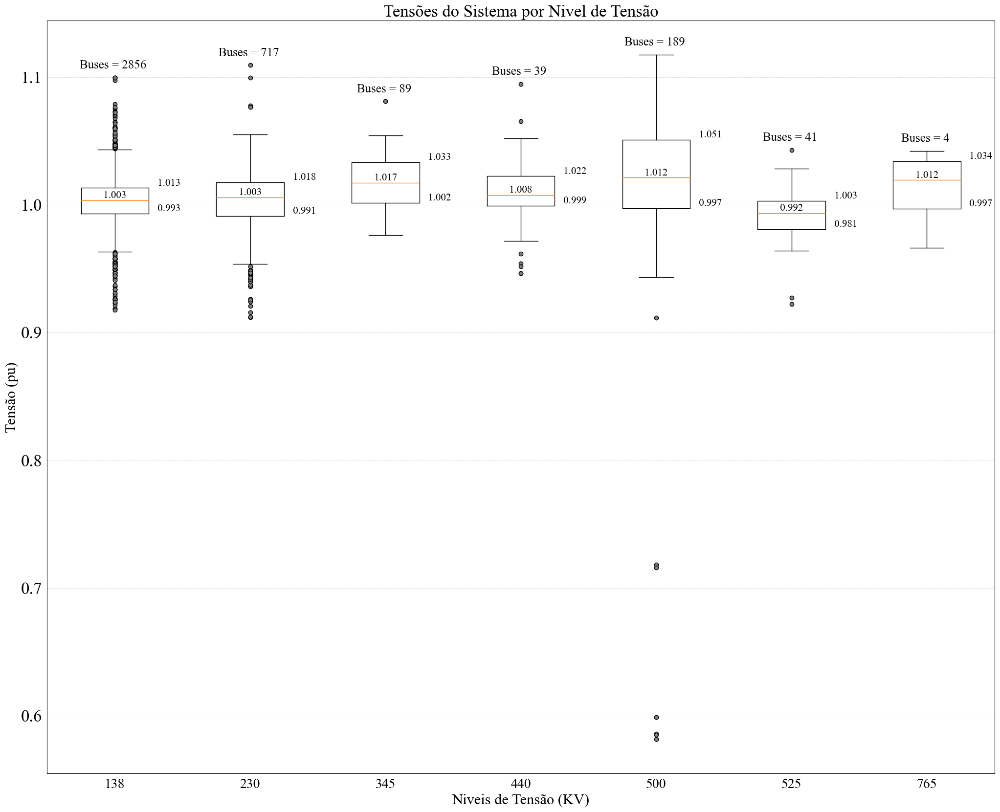

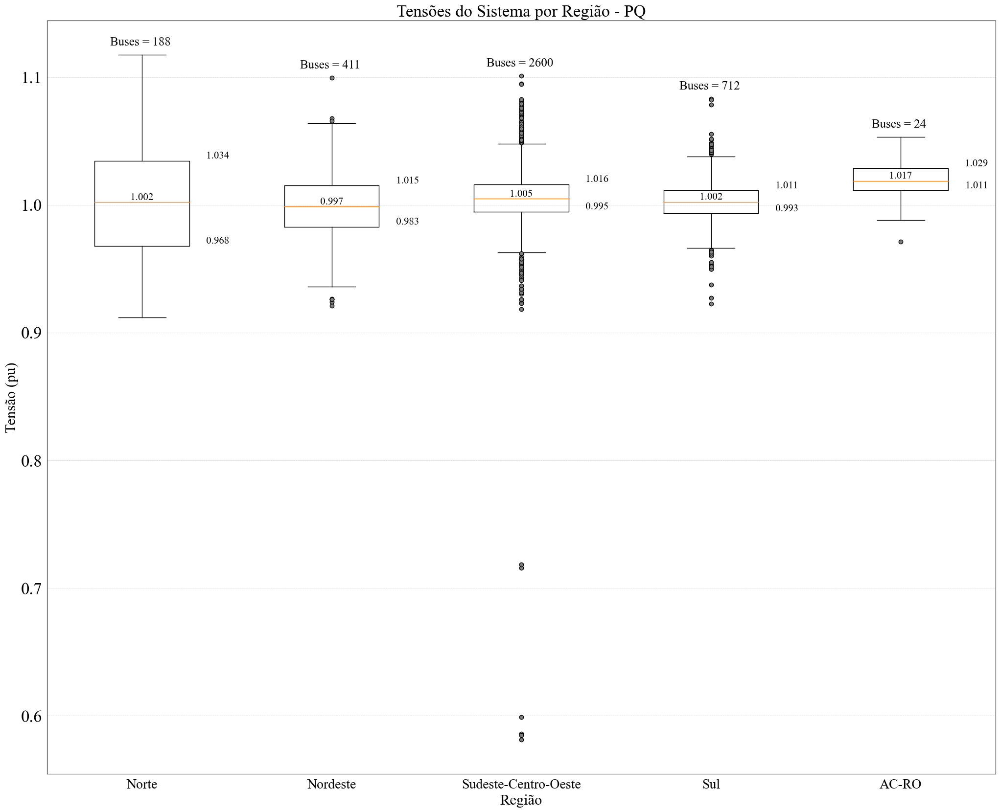

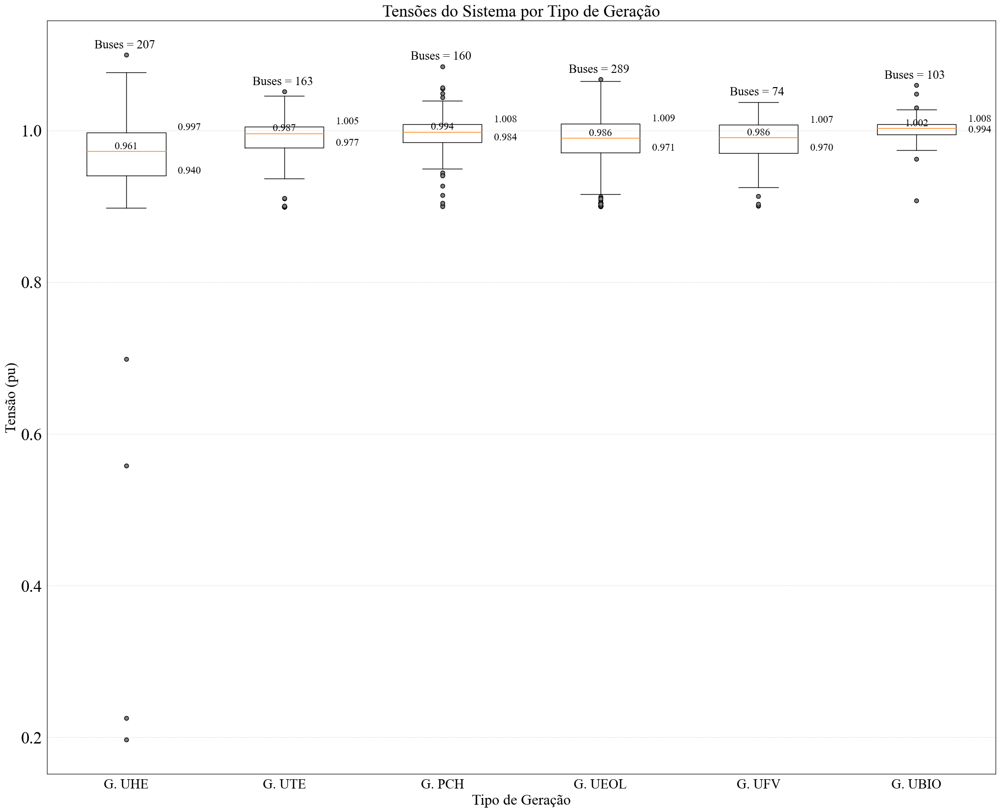

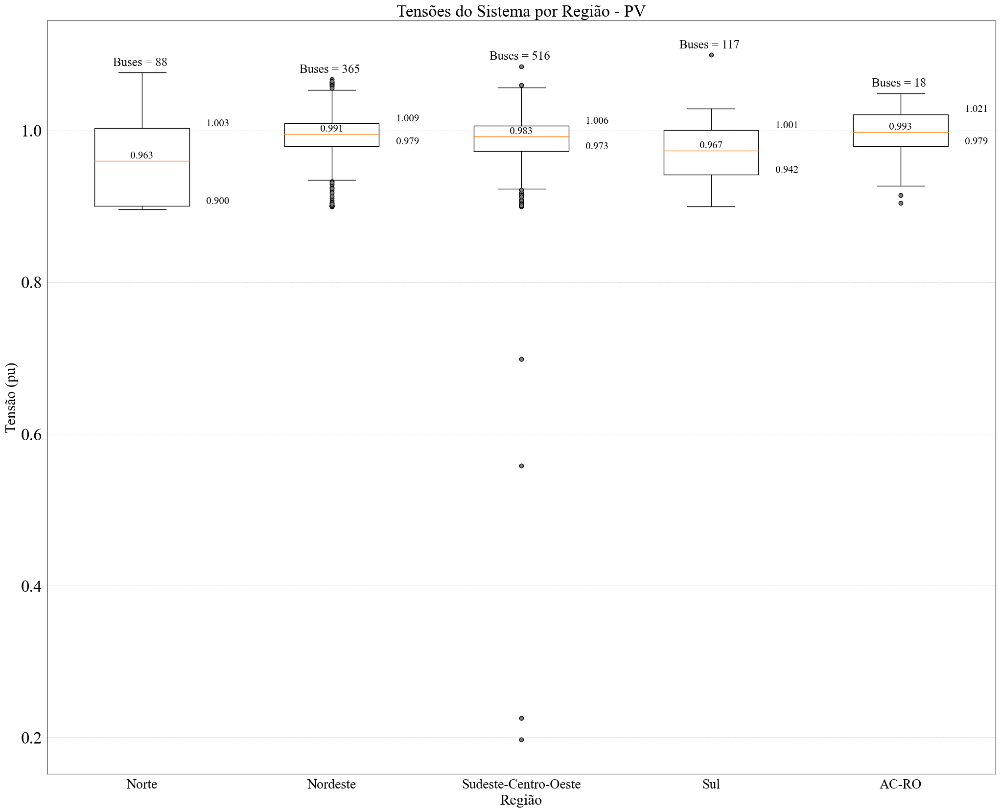

In [4]:
def boxplot_barrasGeracao(Df_VF):
    
    Df_groupbyUF = Df_VF.groupby(by = ['Gen_Type']).agg({'BUS_ID': 'unique', 'MODV_PU': list,})
    Df_groupbyReg = Df_VF.groupby(by = ['REG']).agg({'BUS_ID': 'unique', 'MODV_PU': list,})
    #***************************************************************************************************
    data =  Df_groupbyUF['MODV_PU'][['UHE', 'UTE', 'PCH', 'EOL', 'UFV', 'BIO']] 
    Nbarras = Df_groupbyUF['BUS_ID'][['UHE', 'UTE', 'PCH', 'EOL', 'UFV', 'BIO']]
    labels = ['G. UHE', 'G. UTE', 'G. PCH','G. UEOL', 'G. UFV','G. UBIO']  # Tus etiquetas de datos
    title = 'Tensões do Sistema por Tipo de Geração'  # Tu título
    xlabel = 'Tipo de Geração'  # Tu etiqueta del eje x
    ylabel = 'Tensão (pu)'  # Tu etiqueta del eje y
    plot_boxplot(data, labels, title, xlabel, ylabel,text= True, nbarra = Nbarras)#limites = [0.88,1.125]
    #***************************************************************************************************
    Nbarras = Df_groupbyReg['BUS_ID'][['Norte','Nordeste','Sudeste-Centro-Oeste','Sul','AC-RO']]
    data = Df_groupbyReg['MODV_PU'][['Norte','Nordeste','Sudeste-Centro-Oeste','Sul','AC-RO']]
    labels = ['Norte','Nordeste','Sudeste-Centro-Oeste','Sul','AC-RO']  # Tus etiquetas de datos
    title = 'Tensões do Sistema por Região - PV'  # Tu título
    xlabel = 'Região'  # Tu etiqueta del eje x
    ylabel = 'Tensão (pu)'  # Tu etiqueta del eje y
    plot_boxplot(data, labels, title, xlabel, ylabel,text= True, nbarra = Nbarras)#, limites = [0.82,1.18]

def boxplot_barrasCarga(Df_VF):

    Df_Vfpt = Df_VF[Df_VF['VBASEKV'].isin([138,230,345,440,500,525,765])]
    #***************************************************************************************************
    V_NT = Df_Vfpt.groupby(by = ['VBASEKV']).agg({'BUS_ID': 'unique', 'MODV_PU': list,})
    n_bar = V_NT['BUS_ID'][[138,230,345,440,500,525,765]]
    numbarra = list(n_bar)
    data = V_NT['MODV_PU'][[138,230,345,440,500,525,765]]
    labels = ['138','230','345','440','500','525','765']  # Tus etiquetas de datos
    title = 'Tensões do Sistema por Nivel de Tensão'  # Tu título
    xlabel = 'Niveis de Tensão (KV)'  # Tu etiqueta del eje x
    ylabel = 'Tensão (pu)'  # Tu etiqueta del eje y
    plot_boxplot(data, labels, title, xlabel, ylabel, text=True, nbarra = numbarra)#limites = [0.95, 1.105]
    #***************************************************************************************************
    Df_groupbyReg = Df_Vfpt.groupby(by = ['REG']).agg({'BUS_ID': 'unique', 'MODV_PU': list,})
    Nbarras = Df_groupbyReg['BUS_ID'][['Norte','Nordeste','Sudeste-Centro-Oeste','Sul','AC-RO']]
    data = Df_groupbyReg['MODV_PU'][['Norte','Nordeste','Sudeste-Centro-Oeste','Sul','AC-RO']]
    labels = ['Norte','Nordeste','Sudeste-Centro-Oeste','Sul','AC-RO']  # Tus etiquetas de datos
    title = 'Tensões do Sistema por Região - PQ'  # Tu título
    xlabel = 'Região'  # Tu etiqueta del eje x
    ylabel = 'Tensão (pu)'  # Tu etiqueta del eje y
    plot_boxplot(data, labels, title, xlabel, ylabel,text= True, nbarra = Nbarras)#, limites = [0.82,1.18]


if GeralAnalise:
    boxplot_barrasCarga(df_Final_nt)
    boxplot_barrasGeracao(df_Final_ger)

# Mapas

In [5]:
from Maps import *
if MapasAnalise:
    Df_VF = processdata.Df_VF
    options = {'Limit Violations All': True, 'Mean and Variance': False, 'Limit Violations by Group': False, 'HeatMap by state 1': False, 'Limit Violations PO': True}
    Maps(Df_VF, dff_NT_map, dff_Ger_map, cenario, options, region=None)

# STATIC ASSESMENT

In [6]:
from computeDPI import *

print('CALCULO DO DPI para todos os Cenários:')
ts = 0.8
tb = 1
VVI = computeDPI(df_Final_nt, df_Final_ger, ts, tb, p_norm = 2, p_inf = True, NBcv = True)
dfPQ_CSI = VVI.dfPQ_CSI
dfPV_CSI = VVI.dfPV_CSI
df_PQ_reg = VVI.df_PQ_reg
df_PV_reg = VVI.df_PV_reg
df_busPQ = VVI.df_busPQ
df_busPV = VVI.df_busPV
n_maior = VVI.n_maior

dfPQ_CSI = dfPQ_CSI.groupby(['Dia' , 'Hora', 'REG']).first()
dfPV_CSI = dfPV_CSI.groupby(['Dia' , 'Hora', 'REG']).first()
dffPQgb = df_PQ_reg.groupby(by=['Dia','Hora','REG','VBASEKV']).agg({'CSI_INF':'first','CSI_SUP':'first'})
dffPVgb = df_PV_reg.groupby(by=['Dia','Hora','REG','Gen_Type']).agg({'CSI_INF':'first','CSI_SUP':'first'})


CALCULO DO DPI para todos os Cenários:


## a) Resumo Indice 

In [7]:
df_busPQ['VBASEKV'].value_counts()

VBASEKV
230.0    717
500.0    189
345.0     89
525.0     41
440.0     39
765.0      4
Name: count, dtype: int64

In [8]:
df_busPV.set_index('REG').loc['Sul']['Gen_Type'].value_counts()

Gen_Type
UHE    34
EOL    30
SIN    19
UTE    17
PCH    11
BIO     1
Name: count, dtype: int64

In [9]:
df_busPQ[(df_busPQ['REG'] == 'Sudeste-Centro-Oeste') & (df_busPQ['IndiceInf']>0)]

,BUS_ID,BUS_NAME,ARE,VBASEKV,MODV_PU,ANGV_DEG,IndiceInf,IndiceSup,Dia,Hora,Gen_Type,REG,U_FED
2392,3002.0,M.MARA-GO230,519.0,230.0,0.949249,-18.1582,0.01502,0.0,PO,12-00,NaN,Sudeste-Centro-Oeste,GO
3054,3967.0,SSALVA-GO230,513.0,230.0,0.936686,3.8925,0.26628,0.0,PO,12-00,NaN,Sudeste-Centro-Oeste,GO
428,544.0,PPRIMA-SP440,203.0,440.0,0.946509,6.1674,0.06982,0.0,PO,12-00,NaN,Sudeste-Centro-Oeste,SP
6844,9544.0,NPPRIM-MS440,401.0,440.0,0.946552,6.1544,0.06896,0.0,PO,12-00,NaN,Sudeste-Centro-Oeste,MS
2411,3021.0,VIANA2-ES500,301.0,500.0,0.974687,-19.4829,0.50626,0.0,PO,12-00,NaN,Sudeste-Centro-Oeste,ES
2423,3034.0,JNEIV2-ES500,301.0,500.0,0.985378,-18.8675,0.29244,0.0,PO,12-00,NaN,Sudeste-Centro-Oeste,ES
3368,4351.0,PPARA2-MG500,351.0,500.0,0.994982,-8.0431,0.10036,0.0,PO,12-00,NaN,Sudeste-Centro-Oeste,MG
3369,4352.0,GVALA6-MG500,351.0,500.0,0.995987,-12.8930,0.08026,0.0,PO,12-00,NaN,Sudeste-Centro-Oeste,MG
3457,4491.0,SMANOE-MT500,471.0,500.0,0.999613,8.1583,0.00774,0.0,PO,12-00,NaN,Sudeste-Centro-Oeste,MT
3459,4493.0,TPIRES-MT500,471.0,500.0,0.999310,7.4498,0.01380,0.0,PO,12-00,NaN,Sudeste-Centro-Oeste,MT


In [ ]:
typebus = 'PV'
region = 'Sudeste-Centro-Oeste'

print('========== Analise na região ' + region + ' ===========')
if typebus == 'PQ':
    print('====== Analise das BARRAS PQ: ========')
    dfregion = df_busPQ[(df_busPQ['REG'] == region)]
    grupobarras1 = dfregion['VBASEKV'].unique()
elif typebus == 'PV':
    print('====== Analise das BARRAS PV: ======')
    dfregion = df_busPV[(df_busPV['REG'] == region)]
    grupobarras1 = dfregion['Gen_Type'].unique()

for GT in grupobarras1:
    print('Grupo de Barras: ' + str(GT))
    print('numero total de barras: ' + str(dfregion[(dfregion['Gen_Type'] == GT)].shape[0]))

    # print('violação limite de alarme superior: ')
    # print('barras com violação: ',dfregion[(dfregion['Gen_Type'] == GT) & (dfregion['IndiceSup']>0) & (dfregion['IndiceSup']<=1)]['MODV_PU'].count())

    print('violação limite de alarme inferior: ')
    print('barras com violação: ',dfregion[(dfregion['Gen_Type'] == GT) & (dfregion['IndiceInf']>0) & (dfregion['IndiceInf']<=1)]['MODV_PU'].count())

    # print('violação limite de inseguridad superior: ')
    # print('barras com violação: ',dfregion[(dfregion['Gen_Type'] == GT) & (dfregion['IndiceSup']>1) ]['MODV_PU'].count())

    print('violação limite de inseguridad inferior: ')
    print('barras com violação: ',dfregion[(dfregion['Gen_Type'] == GT) & (dfregion['IndiceInf']>1) ]['MODV_PU'].count())
    print('')

========== Analise na região Sudeste-Centro-Oeste ===========
====== Analise das BARRAS PV: ======
Grupo de Barras: BIO
numero total de barras: 102
violação limite de alarme inferior: 
barras com violação:  1
violação limite de inseguridad inferior: 
barras com violação:  0

Grupo de Barras: EOL
numero total de barras: 2
violação limite de alarme inferior: 
barras com violação:  1
violação limite de inseguridad inferior: 
barras com violação:  0

Grupo de Barras: PCH
numero total de barras: 143
violação limite de alarme inferior: 
barras com violação:  6
violação limite de inseguridad inferior: 
barras com violação:  1

Grupo de Barras: SIN
numero total de barras: 30
violação limite de alarme inferior: 
barras com violação:  7
violação limite de inseguridad inferior: 
barras com violação:  1

Grupo de Barras: UFV
numero total de barras: 29
violação limite de alarme inferior: 
barras com violação:  2
violação limite de inseguridad inferior: 
barras com violação:  0

Grupo de Barras: UHE

In [ ]:
DFS_INS = [dfPQ_CSI[dfPQ_CSI['CSI_INF_FINAL']>1],
        dfPQ_CSI[dfPQ_CSI['CSI_SUP_FINAL']>1],
        dfPV_CSI[dfPV_CSI['CSI_INF_FINAL']>1],
        dfPV_CSI[dfPV_CSI['CSI_SUP_FINAL']>1]]
CasosInseguros = pd.concat(DFS_INS, axis=0,)
CasosInseguros = CasosInseguros.sort_index()
lista = [index[:2] for index in CasosInseguros.index]
conjunto_filtros_INSG = set(map(tuple, lista))
print('Numero de casos com indice >  1, INSEGUROS: ' + str(len(conjunto_filtros_INSG)) + '=> ' + str(round(len(conjunto_filtros_INSG)/1344*100,2)))
print('====================================================================')


DFS_ALARM = [dfPQ_CSI[(dfPQ_CSI['CSI_INF_FINAL']<=1) & (dfPQ_CSI['CSI_INF_FINAL']>0)],
        dfPQ_CSI[(dfPQ_CSI['CSI_SUP_FINAL']<=1) & (dfPQ_CSI['CSI_SUP_FINAL']>0)],
        dfPV_CSI[(dfPV_CSI['CSI_INF_FINAL']<=1) & (dfPV_CSI['CSI_INF_FINAL']>0)],
        dfPV_CSI[(dfPV_CSI['CSI_SUP_FINAL']<=1) & (dfPV_CSI['CSI_SUP_FINAL']>0)]]

CasosAlarme = pd.concat(DFS_ALARM, axis=0,)
filtroalarme = (CasosAlarme.index.to_frame()[['Dia', 'Hora']].apply(tuple, axis=1).isin(conjunto_filtros_INSG))
CasosAlarme = CasosAlarme[~filtroalarme]
CasosAlarme = CasosAlarme.sort_index()
lista = [index[:2] for index in CasosAlarme.index]
conjunto_filtros_ALRM = set(map(tuple, lista))

print('====================================================================')
print('Numero de casos com indice  ALARME: ' + str(len(conjunto_filtros_ALRM)) + '=> ' + str(round(len(conjunto_filtros_ALRM)/1344*100,2)))
print('====================================================================')


DFS_SECURE = [dfPQ_CSI[(dfPQ_CSI['CSI_INF_FINAL']==0) & (dfPQ_CSI['CSI_INF_FINAL']==0)],
        dfPQ_CSI[(dfPQ_CSI['CSI_SUP_FINAL']==0) & (dfPQ_CSI['CSI_SUP_FINAL']==0)],
        dfPV_CSI[(dfPV_CSI['CSI_INF_FINAL']==0) & (dfPV_CSI['CSI_INF_FINAL']==0)],
        dfPV_CSI[(dfPV_CSI['CSI_SUP_FINAL']==0) & (dfPV_CSI['CSI_SUP_FINAL']==0)]]

CasosSecure = pd.concat(DFS_SECURE, axis=0,)
filtroseguro = (CasosSecure.index.to_frame()[['Dia', 'Hora']].apply(tuple, axis=1).isin(conjunto_filtros_INSG | conjunto_filtros_ALRM))
CasosSecure = CasosSecure[~filtroseguro]
CasosSecure = CasosSecure.sort_index()
lista = [index[:2] for index in CasosSecure.index]
conjunto_filtros = set(map(tuple, lista))

print('====================================================================')
print('Numero de casos com indice Seguro: ' + str(len(conjunto_filtros)) + '=> ' + str(round(len(conjunto_filtros)/1344*100,2)))
print('====================================================================')


print('===========================SUBTENSÃO==============================')
DFS_INS = [dfPQ_CSI[dfPQ_CSI['CSI_INF_FINAL']>1],
        dfPV_CSI[dfPV_CSI['CSI_INF_FINAL']>1]]
CasosInseguros = pd.concat(DFS_INS, axis=0,)
CasosInseguros = CasosInseguros.sort_index()
lista = [index[:2] for index in CasosInseguros.index]
conjunto_filtros_INSG = set(map(tuple, lista))

print('Numero de casos com indice >  1, INSEGUROS: ' + str(len(conjunto_filtros_INSG)) + '=> ' + str(round(len(conjunto_filtros_INSG)/1344*100,2)))
print('====================================================================')

DFS_ALARM = [dfPQ_CSI[(dfPQ_CSI['CSI_INF_FINAL']<=1) & (dfPQ_CSI['CSI_INF_FINAL']>0)],
        dfPV_CSI[(dfPV_CSI['CSI_INF_FINAL']<=1) & (dfPV_CSI['CSI_INF_FINAL']>0)],]

CasosAlarme = pd.concat(DFS_ALARM, axis=0,)
filtroalarme = (CasosAlarme.index.to_frame()[['Dia', 'Hora']].apply(tuple, axis=1).isin(conjunto_filtros_INSG))
CasosAlarme = CasosAlarme[~filtroalarme]
CasosAlarme = CasosAlarme.sort_index()
lista = [index[:2] for index in CasosAlarme.index]
conjunto_filtros_ALRM = set(map(tuple, lista))

print('====================================================================')
print('Numero de casos com indice  ALARME: ' + str(len(conjunto_filtros_ALRM)) + '=> ' + str(round(len(conjunto_filtros_ALRM)/1344*100,2)))
print('====================================================================')

print('===========================SOBRETENSÃO==============================')
DFS_INS = [dfPQ_CSI[dfPQ_CSI['CSI_SUP_FINAL']>1],
        dfPV_CSI[dfPV_CSI['CSI_SUP_FINAL']>1]]
CasosInseguros = pd.concat(DFS_INS, axis=0,)
CasosInseguros = CasosInseguros.sort_index()
lista = [index[:2] for index in CasosInseguros.index]
conjunto_filtros_INSG = set(map(tuple, lista))

print('Numero de casos com indice >  1, INSEGUROS: ' + str(len(conjunto_filtros_INSG)) + '=> ' + str(round(len(conjunto_filtros_INSG)/1344*100,2)))
print('====================================================================')

DFS_ALARM = [dfPQ_CSI[(dfPQ_CSI['CSI_SUP_FINAL']<=1) & (dfPQ_CSI['CSI_SUP_FINAL']>0)],
dfPV_CSI[(dfPV_CSI['CSI_SUP_FINAL']<=1) & (dfPV_CSI['CSI_SUP_FINAL']>0)],]
CasosAlarme = pd.concat(DFS_ALARM, axis=0,)
filtroalarme = (CasosAlarme.index.to_frame()[['Dia', 'Hora']].apply(tuple, axis=1).isin(conjunto_filtros_INSG))
CasosAlarme = CasosAlarme[~filtroalarme]
CasosAlarme = CasosAlarme.sort_index()
lista = [index[:2] for index in CasosAlarme.index]
conjunto_filtros_ALRM = set(map(tuple, lista))
print('====================================================================')
print('Numero de casos com indice  ALARME: ' + str(len(conjunto_filtros_ALRM)) + '=> ' + str(round(len(conjunto_filtros_ALRM)/1344*100,2)))
print('====================================================================')

Numero de casos com indice >  1, INSEGUROS: 1=> 0.07
Numero de casos com indice  ALARME: 0=> 0.0
Numero de casos com indice Seguro: 0=> 0.0
===========================SUBTENSÃO==============================
Numero de casos com indice >  1, INSEGUROS: 1=> 0.07
Numero de casos com indice  ALARME: 0=> 0.0
===========================SOBRETENSÃO==============================
Numero de casos com indice >  1, INSEGUROS: 0=> 0.0
Numero de casos com indice  ALARME: 1=> 0.07


In [ ]:
print('******** RESULTADOS BARRAS PQ SOBRETENSÃO ********')
indregsuperior = dfPQ_CSI[dfPQ_CSI['CSI_SUP_FINAL']>1]
for i in df_Final_nt['REG'].unique():
    try:
        print( 'casos com idice acima de 1 na região ' + i + ': ' + str(len(set(map(tuple, indregsuperior.loc[:,:,i].index)))))
    except:
        print('NÃO TEM casos com idice acima de 1 na região ' + i)
        pass

print('******** RESULTADOS BARRAS PV SOBRETENSÃO ********')
indregsuperior = dfPV_CSI[dfPV_CSI['CSI_SUP_FINAL']>1]
for i in df_Final_nt['REG'].unique():
    try:
        print( 'casos com idice acima de 1 na região ' + i + ': ' + str(len(set(map(tuple, indregsuperior.loc[:,:,i].index)))))
    except:
        print('NÃO TEM casos com idice acima de 1 na região ' + i)
        pass

print('******** RESULTADOS BARRAS PQ SUBTENSÃO ********')
indregsuperior = dfPQ_CSI[dfPQ_CSI['CSI_INF_FINAL']>1]
for i in df_Final_nt['REG'].unique():
    try:
        print( 'casos com idice acima de 1 na região ' + i + ': ' + str(len(set(map(tuple, indregsuperior.loc[:,:,i].index)))))
    except:
        print('NÃO TEM casos com idice acima de 1 na região ' + i)
        pass

print('******** RESULTADOS BARRAS PV SUBTENSÃO ********')
indregsuperior = dfPV_CSI[dfPV_CSI['CSI_INF_FINAL']>1]
for i in df_Final_nt['REG'].unique():
    try:
        print( 'casos com idice acima de 1 na região ' + i + ': ' + str(len(set(map(tuple, indregsuperior.loc[:,:,i].index)))))
    except:
        print('NÃO TEM casos com idice acima de 1 na região ' + i)
        pass

******** RESULTADOS BARRAS PQ SOBRETENSÃO ********
NÃO TEM casos com idice acima de 1 na região Sudeste-Centro-Oeste
NÃO TEM casos com idice acima de 1 na região Sul
NÃO TEM casos com idice acima de 1 na região Norte
NÃO TEM casos com idice acima de 1 na região Nordeste
NÃO TEM casos com idice acima de 1 na região AC-RO
******** RESULTADOS BARRAS PV SOBRETENSÃO ********
NÃO TEM casos com idice acima de 1 na região Sudeste-Centro-Oeste
NÃO TEM casos com idice acima de 1 na região Sul
NÃO TEM casos com idice acima de 1 na região Norte
NÃO TEM casos com idice acima de 1 na região Nordeste
NÃO TEM casos com idice acima de 1 na região AC-RO
******** RESULTADOS BARRAS PQ SUBTENSÃO ********
NÃO TEM casos com idice acima de 1 na região Sudeste-Centro-Oeste
NÃO TEM casos com idice acima de 1 na região Sul
NÃO TEM casos com idice acima de 1 na região Norte
NÃO TEM casos com idice acima de 1 na região Nordeste
NÃO TEM casos com idice acima de 1 na região AC-RO
******** RESULTADOS BARRAS PV SUBTEN

## b) Graficos do Indice de Tensão por região

Dia,PO
Hora,12-00
REG,Norte
BUS_ID,106.000000
CSI_INF_POND,13.377833
CSI_SUP_POND,2.343191
CSI_INF_FINAL,0.126206
CSI_SUP_FINAL,0.022106


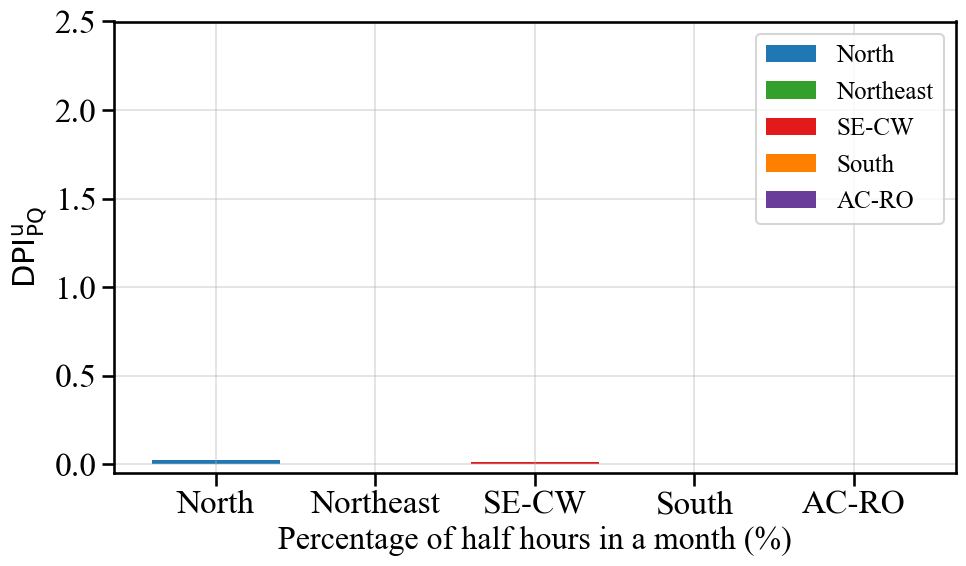

Dia,PO
Hora,12-00
REG,Sudeste-Centro-Oeste
BUS_ID,372.000000
CSI_INF_POND,117.565501
CSI_SUP_POND,3.698707
CSI_INF_FINAL,0.316036
CSI_SUP_FINAL,0.009943


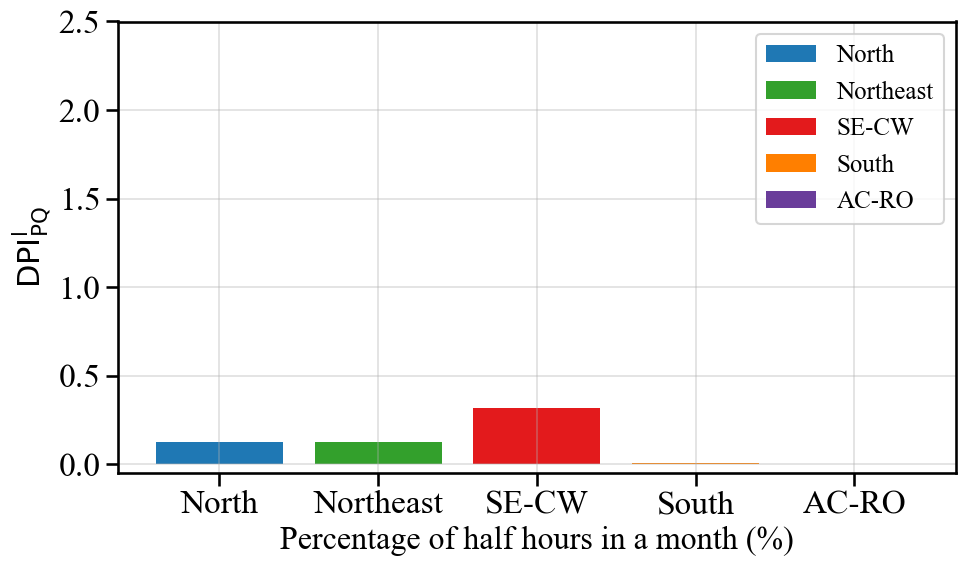

Dia,PO
Hora,12-00
REG,Norte
BUS_ID,83.000000
CSI_INF_POND,38.021840
CSI_SUP_POND,2.972680
CSI_INF_FINAL,0.458094
CSI_SUP_FINAL,0.035815


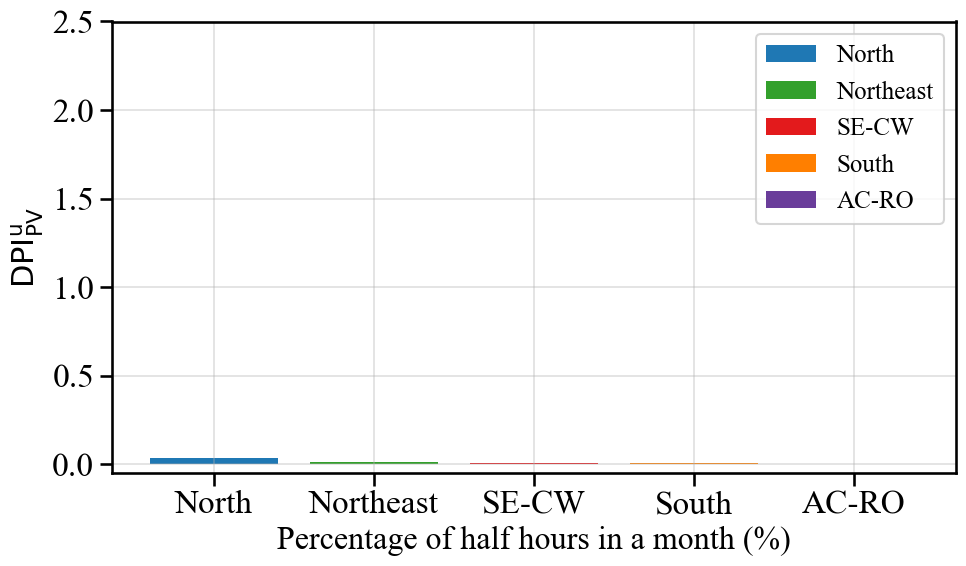

Dia,PO
Hora,12-00
REG,Sudeste-Centro-Oeste
BUS_ID,501.000000
CSI_INF_POND,505.224340
CSI_SUP_POND,2.969240
CSI_INF_FINAL,1.008432
CSI_SUP_FINAL,0.005927


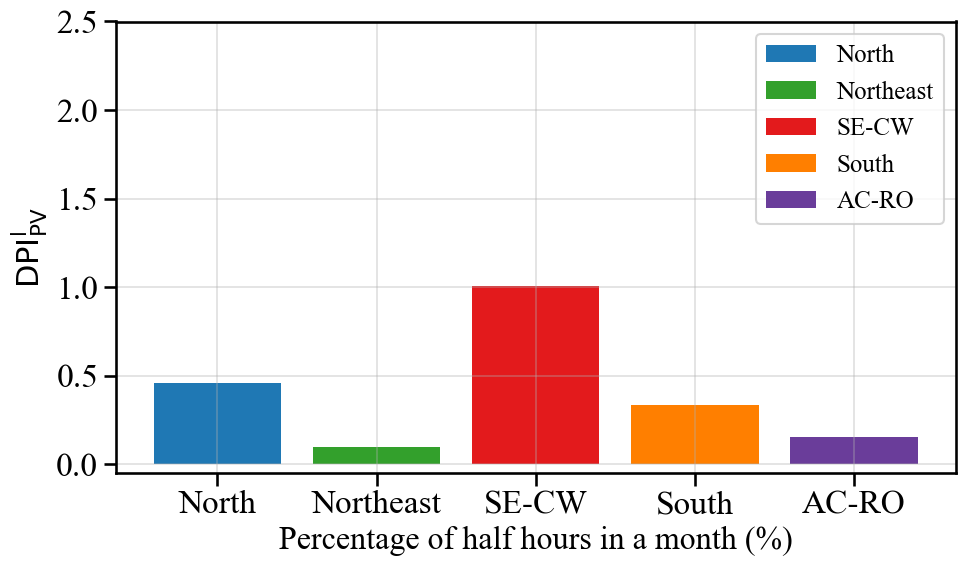

In [ ]:
plt.rcParams["font.family"] = "Times New Roman"
paletadcolor = sns.color_palette()
if plotDPI:
    def plot_indice (df_data, eje_y, name, title, INDICE, xlimites=None,ylimites=None, display_ = True, order = False):

        if display_:
            display(df_data[df_data[INDICE]==df_data[INDICE].max()].T)
        
        fig, axs = plt.subplots(nrows=1, figsize=(10, 6), sharex=False)
        colores = [sns.color_palette("Paired")[1], sns.color_palette("Paired")[3], sns.color_palette("Paired")[5],sns.color_palette("Paired")[7],sns.color_palette("Paired")[9]]
        region_map = {'Nordeste':'Northeast', 'Norte':'North', 'Sudeste-Centro-Oeste':'SE-CW', 'Sul':'South','AC-RO':'AC-RO'}
        for idx, regiao in enumerate(['Norte','Nordeste','Sudeste-Centro-Oeste', 'Sul', 'AC-RO']):
            
            if order:
                data = df_data.loc[:, :, regiao].sort_values(INDICE, ascending=False)[INDICE]
            else:
                data = df_data.loc[:, :, regiao][INDICE]
            
            axs.bar(region_map[regiao], data, color=colores[idx], label=region_map[regiao], linewidth=2, linestyle='-')
            
        axs.legend(loc='upper right', fontsize=18)
        

        axs.tick_params(axis='y', labelsize=24)
        axs.tick_params(axis='x', labelsize=24)
        axs.set_xlabel('Percentage of half hours in a month (%)', fontsize=23)
        axs.set_ylabel(eje_y, fontsize=22)
        axs.set_title(title, fontsize=22)
        if xlimites != None:
            axs.set_xlim(xlimites)
        if ylimites != None:
            axs.set_ylim(ylimites)
        axs.grid(True, linestyle='-', linewidth=1.2, alpha=0.4)
        plt.tight_layout()
        nome = cenario + '/Indice/' + name + '.png'
        plt.savefig(nome)
        plt.show()

    plot_indice (dfPQ_CSI, r'$\mathrm{DPI}_\mathrm{PQ}^\mathrm{u}$', 'DPI_(u)_PQ','','CSI_SUP_FINAL', order=True, ylimites=[-0.05, 2.5])
    plot_indice (dfPQ_CSI, r'$\mathrm{DPI}_\mathrm{PQ}^\mathrm{l}$', 'DPI_(l)_PQ','', 'CSI_INF_FINAL', order=True,ylimites=[-0.05, 2.5])
    plot_indice (dfPV_CSI, r'$\mathrm{DPI}_\mathrm{PV}^\mathrm{u}$', 'DPI_(u)_PV' ,'','CSI_SUP_FINAL', order=True,ylimites=[-0.05, 2.5])
    plot_indice (dfPV_CSI, r'$\mathrm{DPI}_\mathrm{PV}^\mathrm{l}$', 'DPI_(l)_PV', '','CSI_INF_FINAL', order=True,ylimites=[-0.05, 2.5])

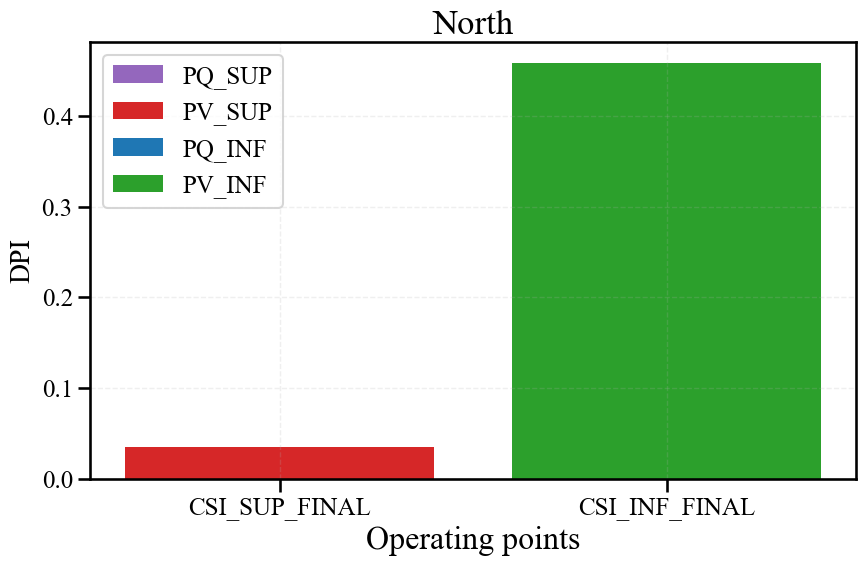

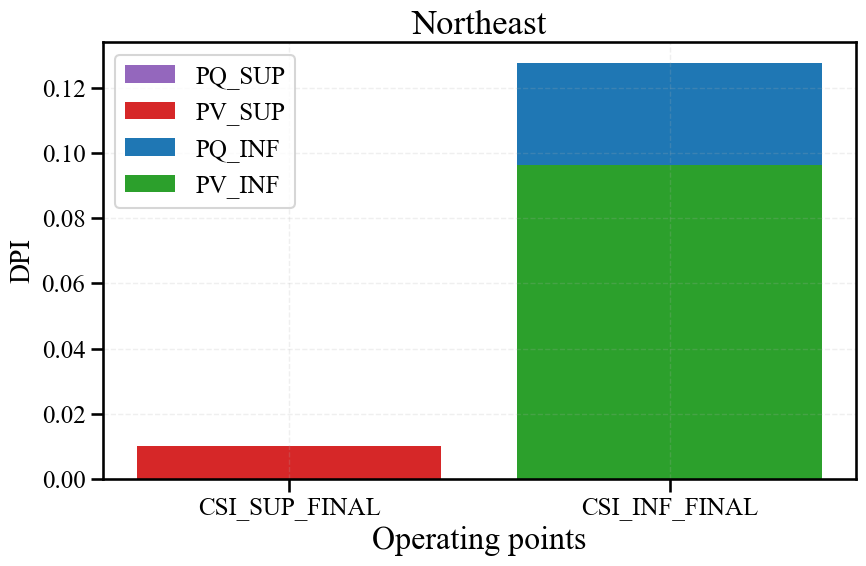

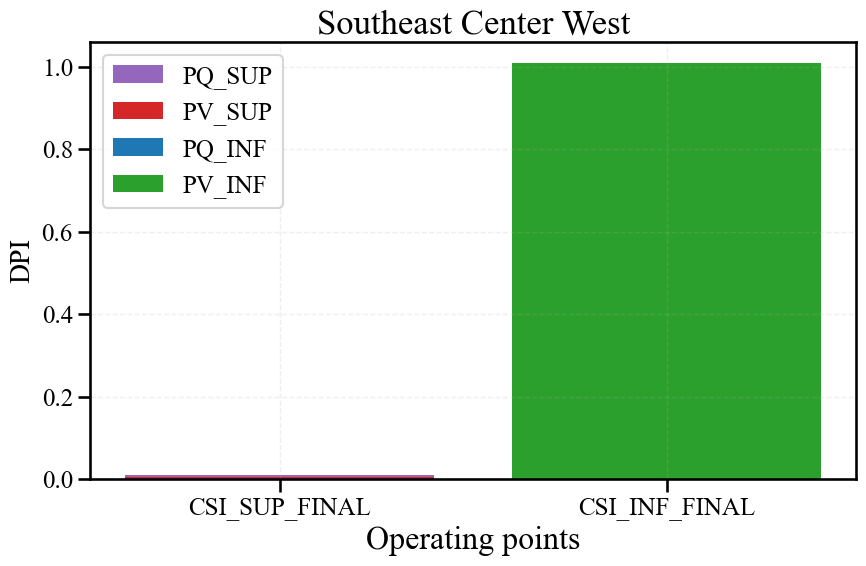

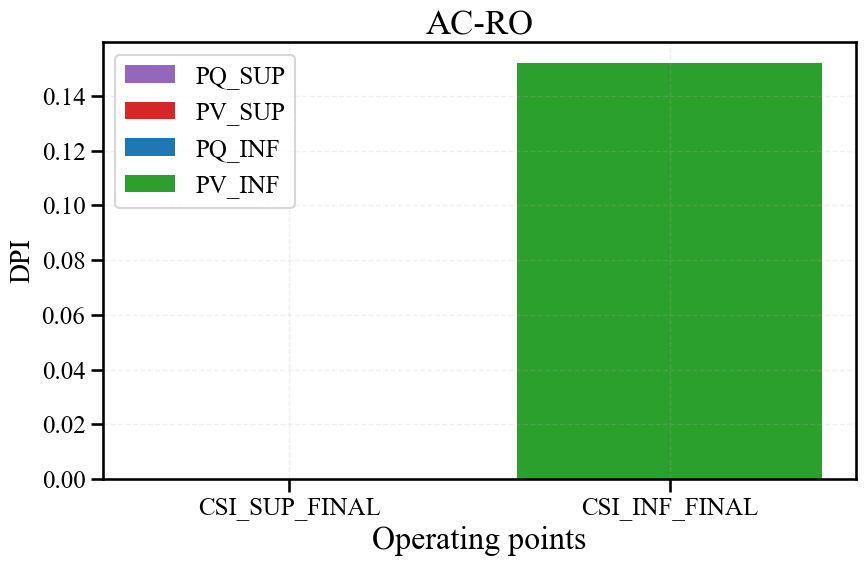

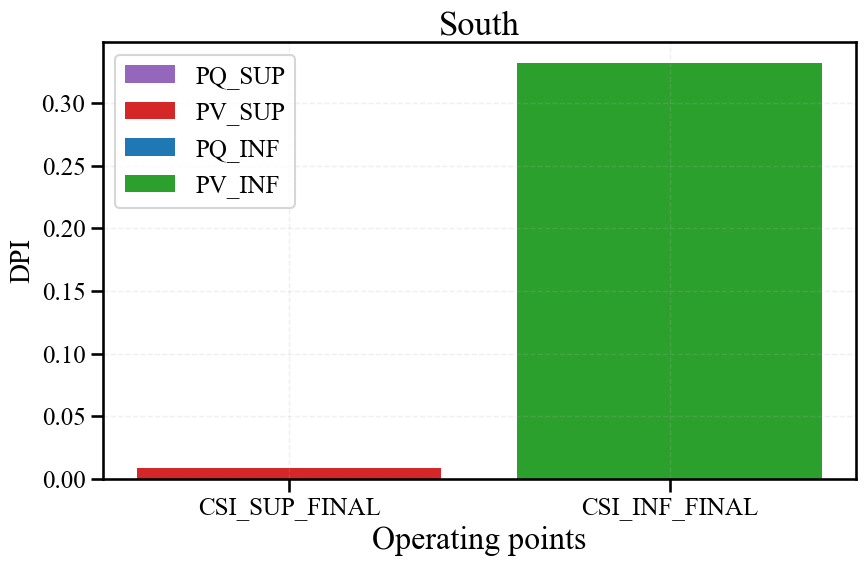

In [ ]:
if plotDPI:

    def plot_indice_1 (df_pv, df_pq, eje_y, title, regiao, limites=None, order = True):

        fig, axs = plt.subplots(nrows=1, figsize=(9, 6))
        colores = [paletadcolor[4], paletadcolor[0], paletadcolor[3],paletadcolor[2],paletadcolor[3]]
        for idx, INDICE in enumerate(['CSI_SUP_FINAL', 'CSI_INF_FINAL']):
            if order:
                datapq = df_pq.loc[:, :, regiao][INDICE]
                datapv = df_pv.loc[:, :, regiao][INDICE]
            else:
                datapq = df_pq.loc[:, :, regiao].sort_values(INDICE, ascending=False)[INDICE]
                datapv = df_pv.loc[:, :, regiao].sort_values(INDICE, ascending=False)[INDICE]
            
            axs.bar(INDICE, datapq.values, color=colores[idx], label='PQ_'+ INDICE[4:7], linewidth=2, linestyle='-')
            axs.bar(INDICE, datapv.values, color=colores[idx + 2 ], label='PV_'+ INDICE[4:7], linewidth=2, linestyle='-')

        axs.legend(loc='best', fontsize=18)

        axs.tick_params(axis='y', labelsize=18)
        axs.tick_params(axis='x', labelsize=18)
        axs.set_xlabel('Operating points', fontsize=23)
        axs.set_ylabel(eje_y, fontsize=20)
        axs.set_title(title, fontsize=25)
        if limites != None:
            axs.set_ylim(limites)
        axs.grid(True, linestyle='--', linewidth=1, alpha=0.2)
        plt.tight_layout()
        plt.show()

    plot_indice_1 (dfPV_CSI, dfPQ_CSI, 'DPI', 'North','Norte',order=False)#limites=[0,1.3]
    plot_indice_1 (dfPV_CSI, dfPQ_CSI, 'DPI', 'Northeast','Nordeste',order=False )#limites=[0,1.3], limites=[-0.1,2]
    plot_indice_1 (dfPV_CSI, dfPQ_CSI, 'DPI', 'Southeast Center West','Sudeste-Centro-Oeste',order=False)#limites=[0,1.3], limites=[-0.1,9]
    plot_indice_1 (dfPV_CSI, dfPQ_CSI, 'DPI', 'AC-RO','AC-RO',order=False)#limites=[0,1.3]
    plot_indice_1 (dfPV_CSI, dfPQ_CSI, 'DPI', 'South','Sul',order=False)#limites=[0,1.3], limites=[-0.1,1.5]

[230. 345. 440. 500. 525. 765.]


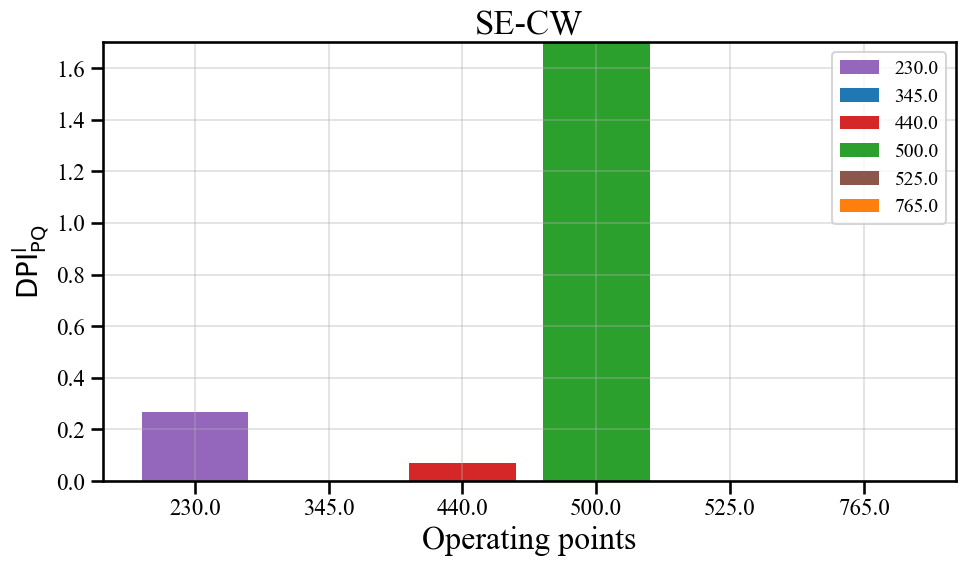

['BIO' 'EOL' 'PCH' 'SIN' 'UFV' 'UHE' 'UTE']


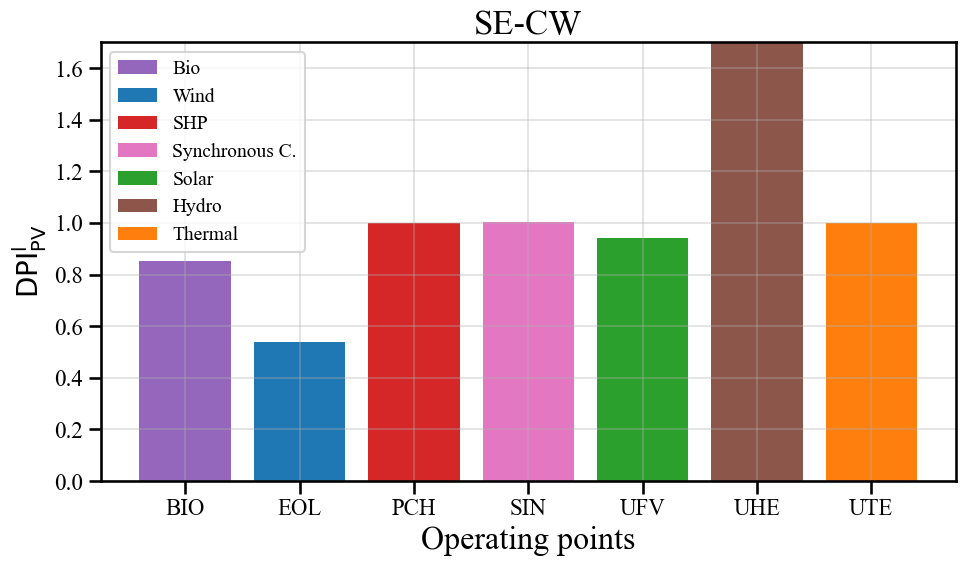

[230. 345. 440. 500. 525. 765.]


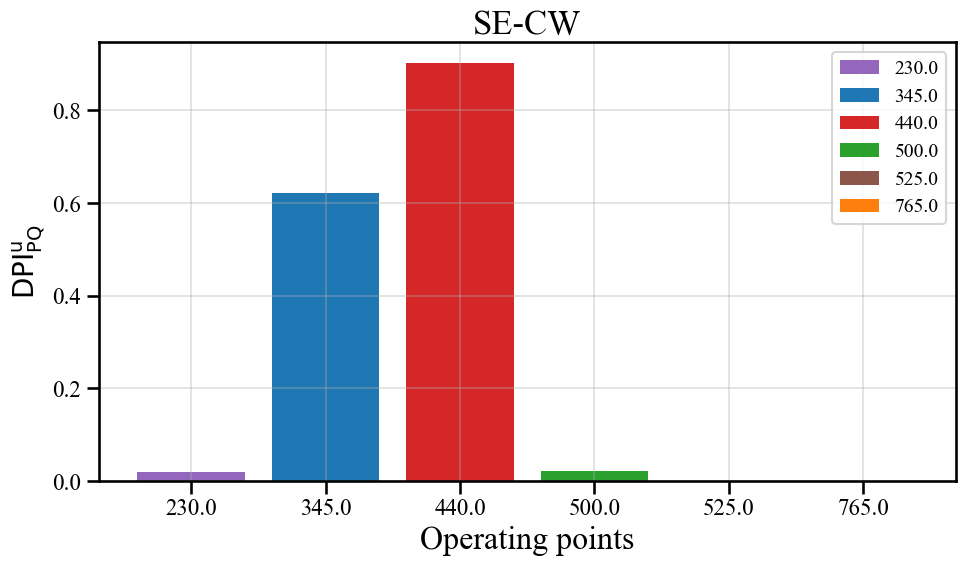

['BIO' 'EOL' 'PCH' 'SIN' 'UFV' 'UHE' 'UTE']


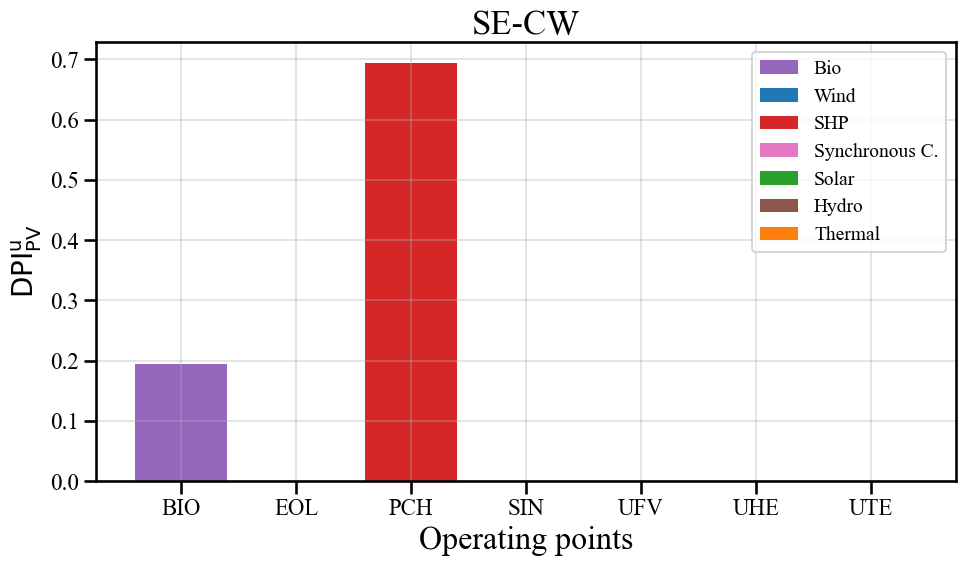

[230. 500. 525. 765.]


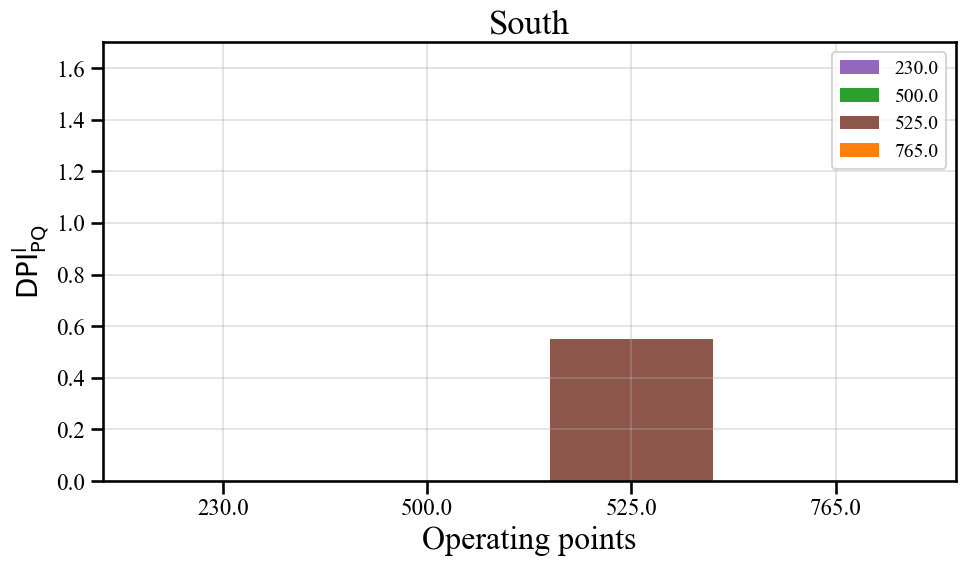

['BIO' 'EOL' 'PCH' 'SIN' 'UHE' 'UTE']


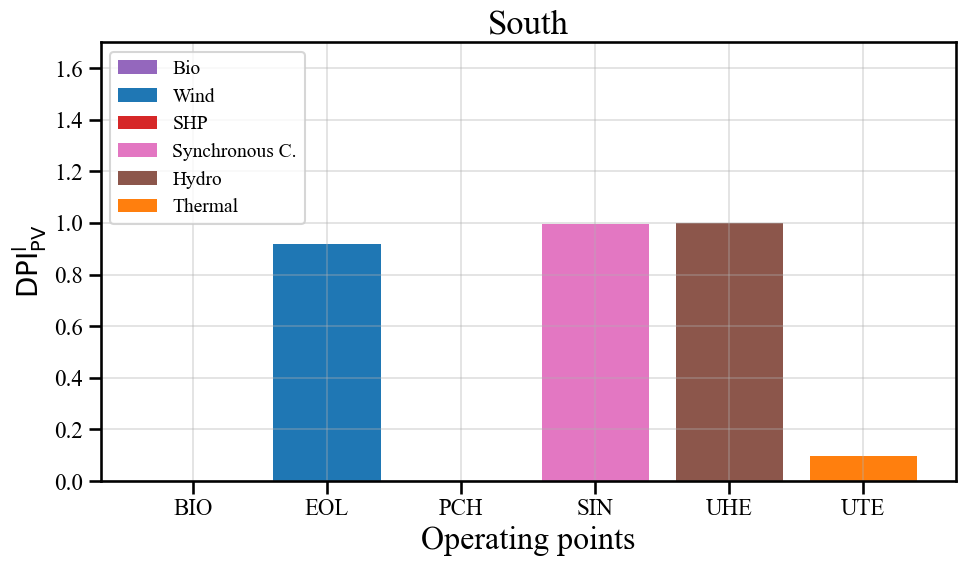

[230. 500. 525. 765.]


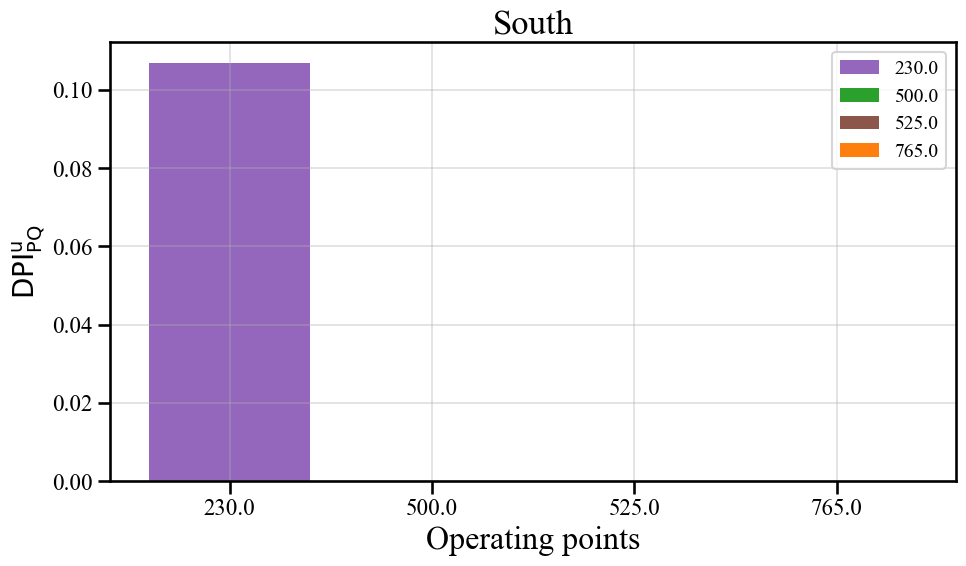

['BIO' 'EOL' 'PCH' 'SIN' 'UHE' 'UTE']


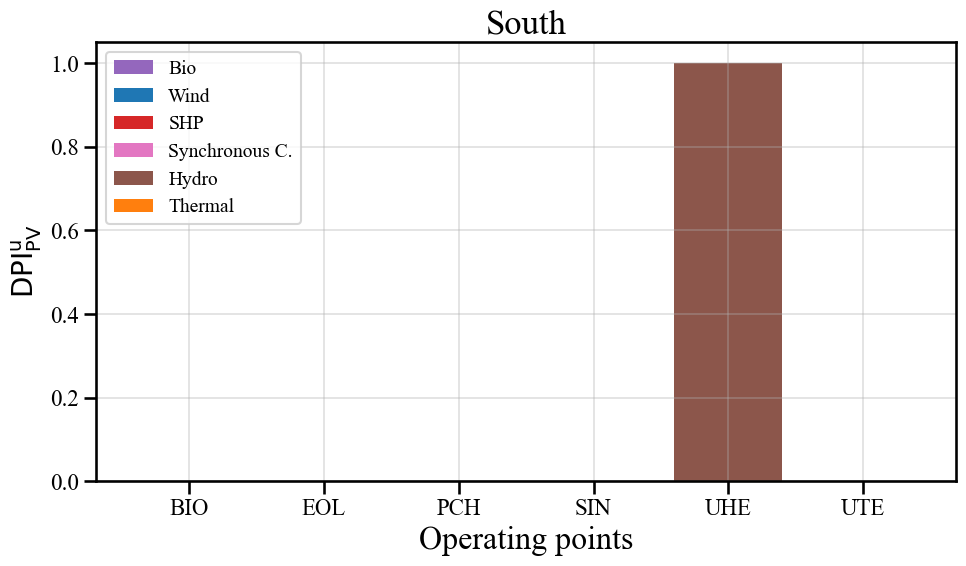

[230. 500.]


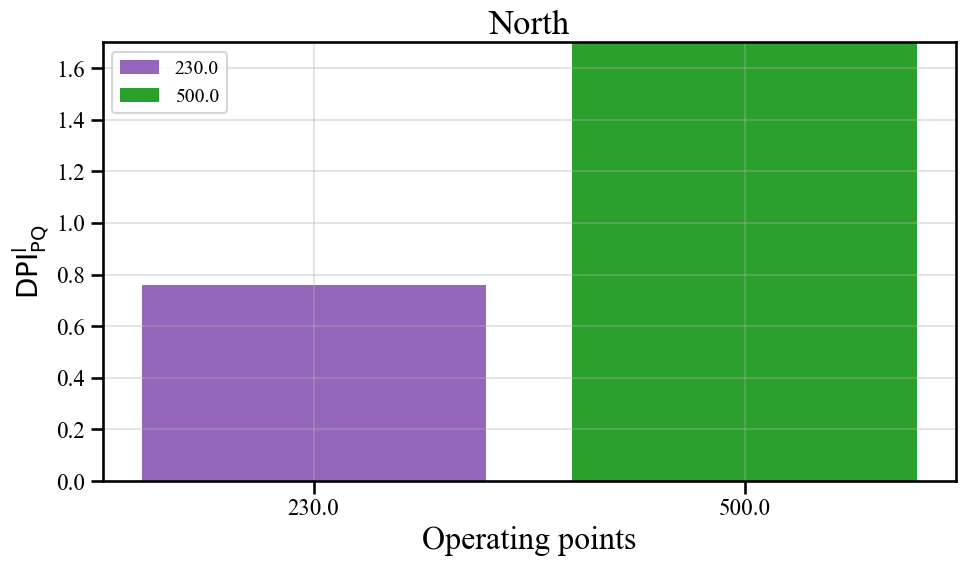

['EOL' 'SIN' 'UFV' 'UHE' 'UTE']


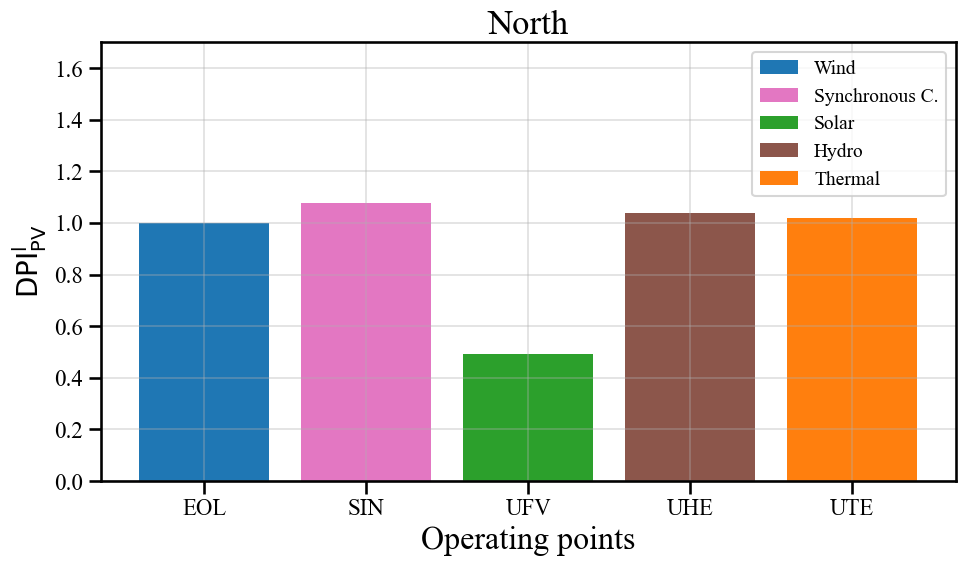

[230. 500.]


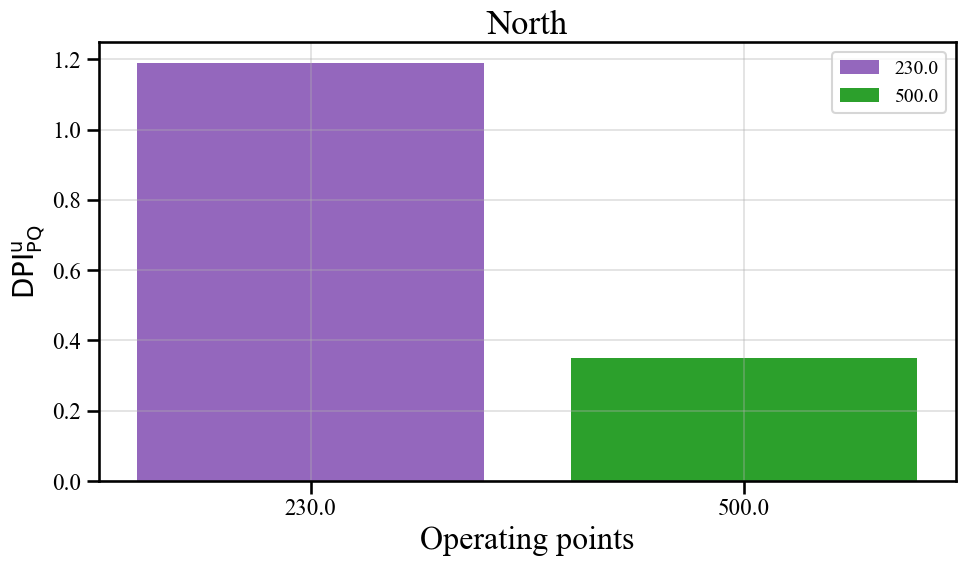

['EOL' 'SIN' 'UFV' 'UHE' 'UTE']


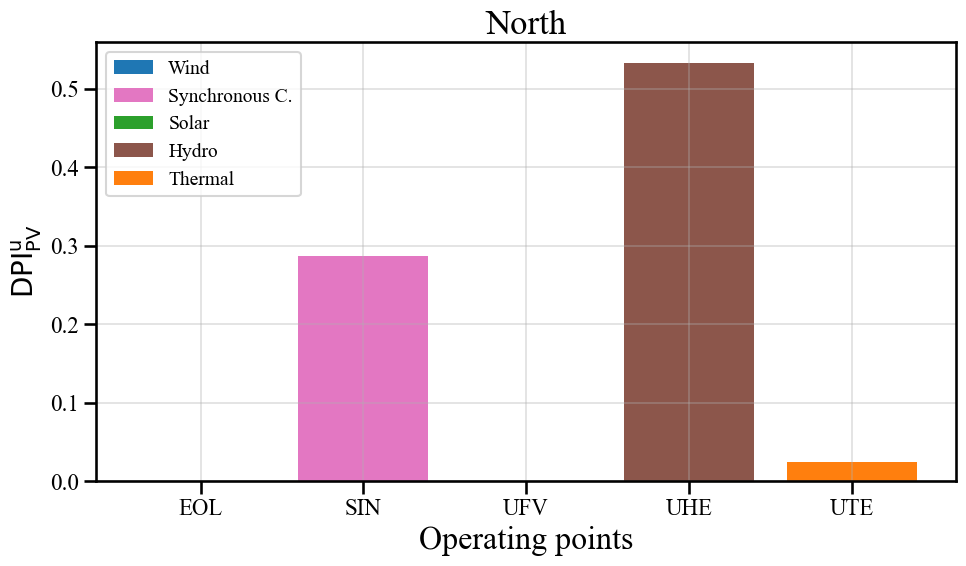

[230. 500.]


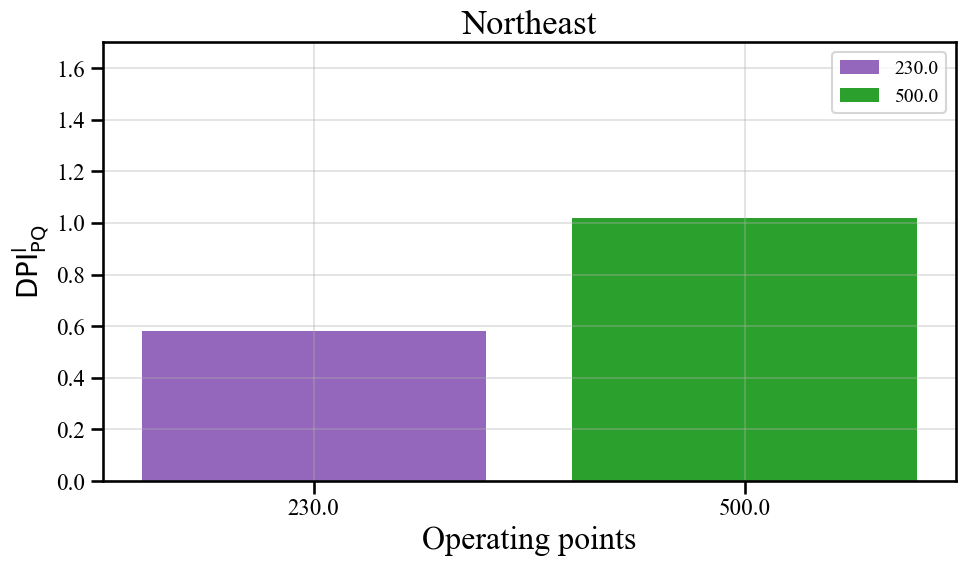

['EOL' 'SIN' 'UFV' 'UHE' 'UTE']


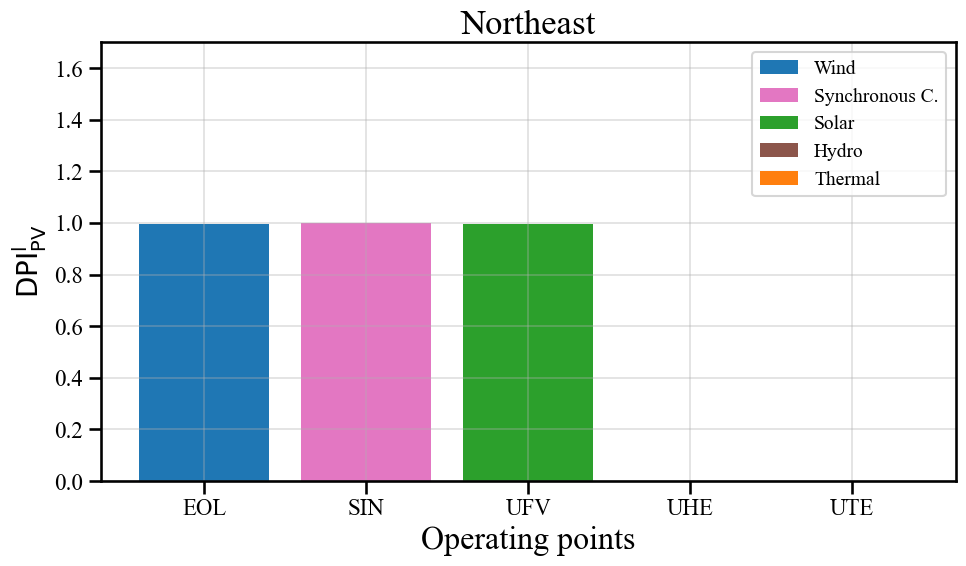

[230. 500.]


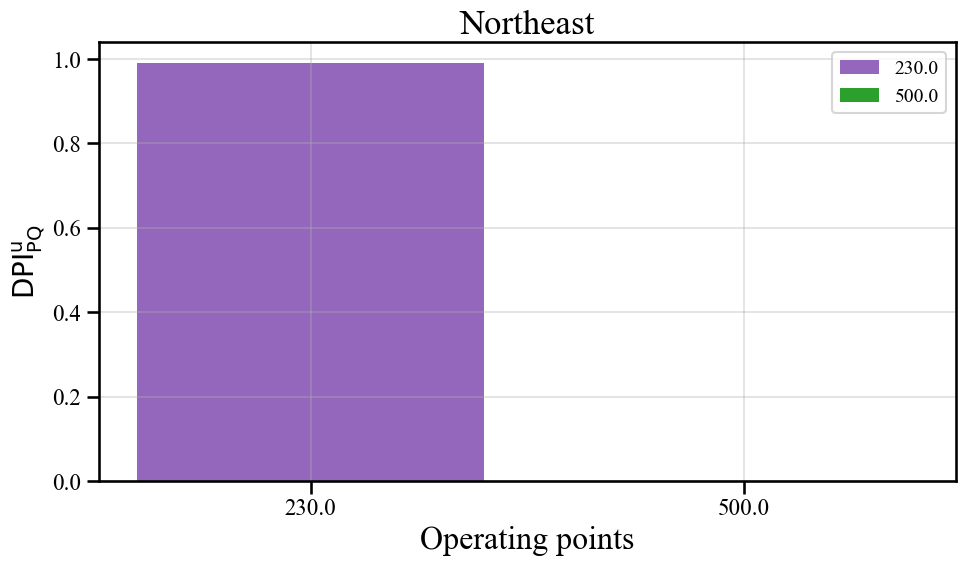

['EOL' 'SIN' 'UFV' 'UHE' 'UTE']


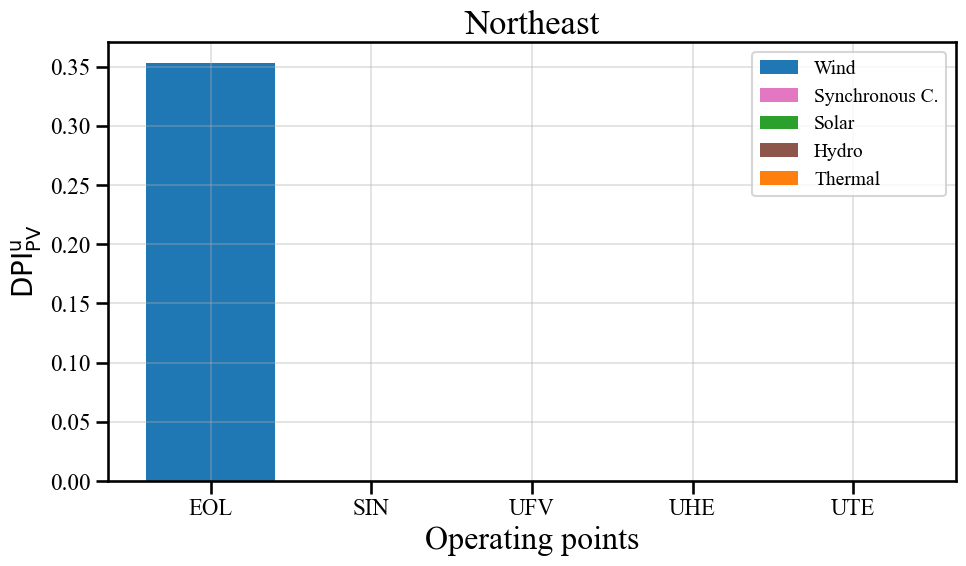

[230.]


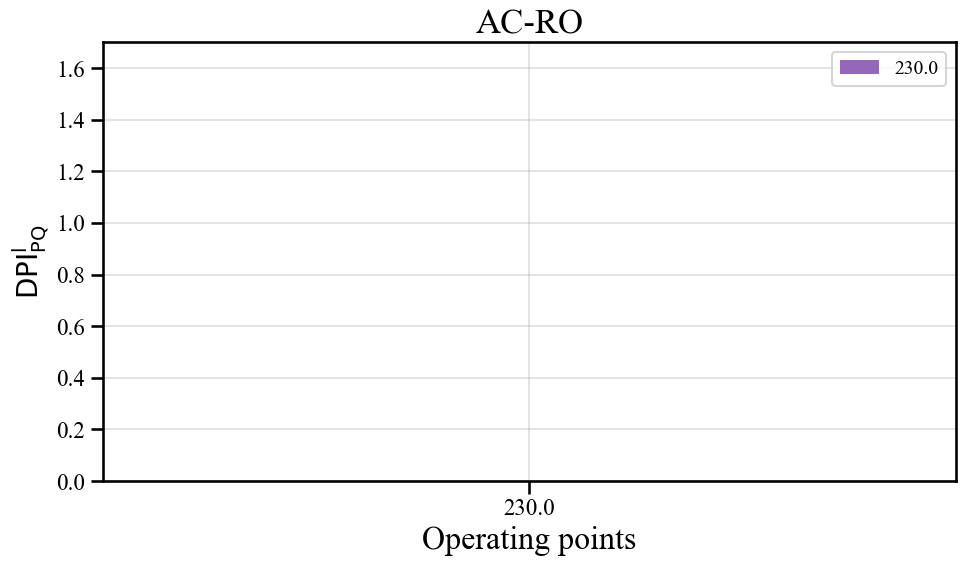

['PCH' 'SIN' 'UHE' 'UTE']


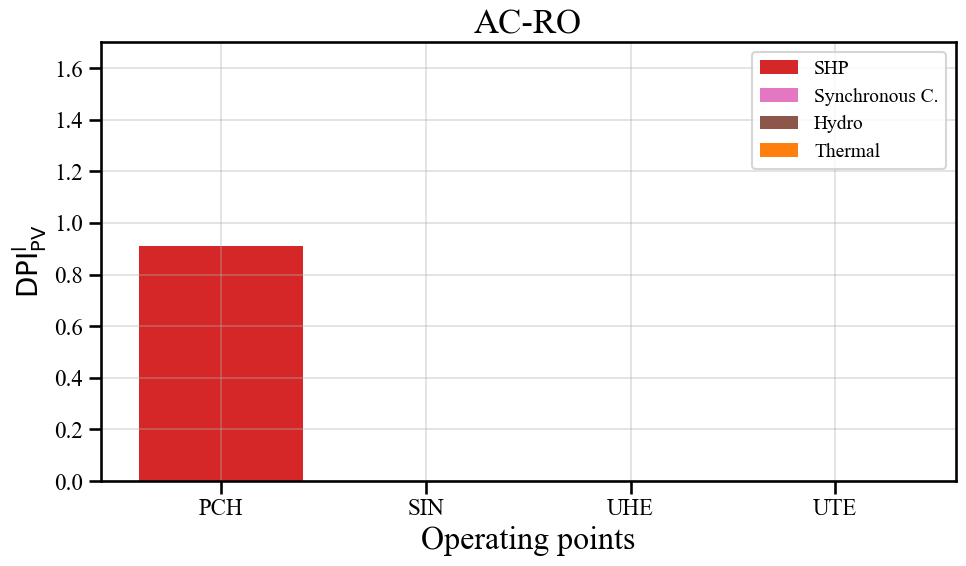

[230.]


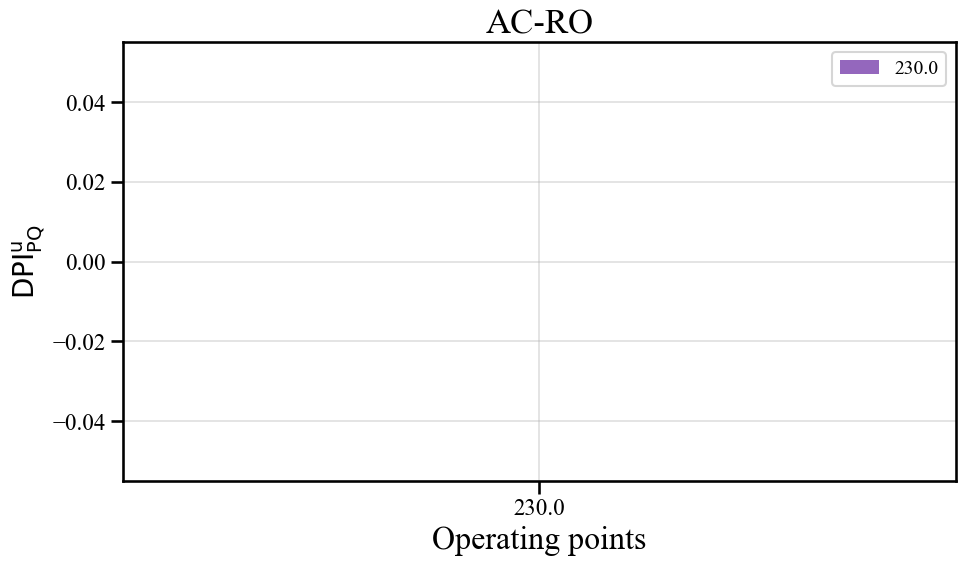

['PCH' 'SIN' 'UHE' 'UTE']


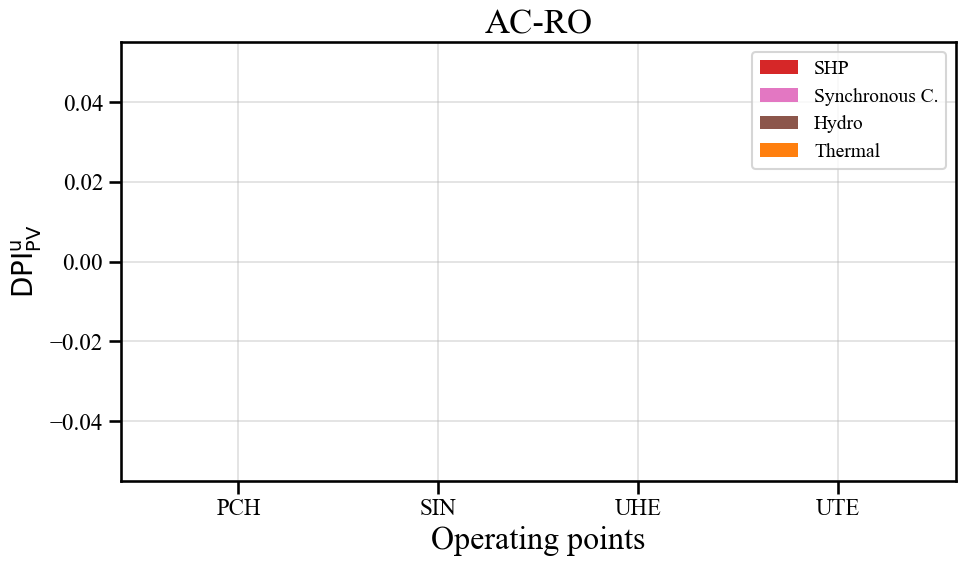

In [ ]:
if plotDPI:
    def plot_indice_2 (df, eje_y, name ,title, regiao, INDICE, GB, limites=None, order = True):

        fig, axs = plt.subplots(nrows=1, figsize=(10, 6))
        labelG = {'BIO': 'Bio', 'EOL': 'Wind', 'PCH': 'SHP','UFV': 'Solar', 'UHE': 'Hydro','UTE': 'Thermal', 'SIN': 'Synchronous C.'}
        if GB=='Gen_Type':
            colores = {'BIO': paletadcolor[4], 'EOL': paletadcolor[0], 'PCH': paletadcolor[3],'UFV': paletadcolor[2], 'UHE': paletadcolor[5],'UTE': paletadcolor[1], 'SIN': paletadcolor[6]}
        else:
            colores = {230: paletadcolor[4], 345: paletadcolor[0], 440: paletadcolor[3],500: paletadcolor[2], 525: paletadcolor[5], 765: paletadcolor[1]}
        data = df.loc[:, :, regiao]
        Busgroup = np.array(data.reset_index(GB)[GB].unique())
        print(Busgroup)
        for idx, G_bus in enumerate(Busgroup):
            if order:
                data_ = df.loc[:, :, regiao, G_bus][INDICE]
            else:
                data_ = df.loc[:, :, regiao, G_bus].sort_values(INDICE, ascending=False)[INDICE]
            if GB=='Gen_Type':
                label = labelG[G_bus]
            else:
                label = G_bus
            # axs.plot(data_.values, color=colores[G_bus], label= label,lw=2)
            axs.bar(str(G_bus), data_.values, color=colores[G_bus], label=label, linewidth=2)

        axs.legend(loc='best', fontsize=14)
        
        axs.set_xlabel('Operating points', fontsize=23)
        axs.set_ylabel(eje_y, fontsize=20)
        axs.set_title(title, fontsize=25)
        if limites != None:
            axs.set_ylim(limites)
        axs.grid(True, linestyle='-', linewidth=1.2, alpha=0.4)
        plt.tight_layout()
        nome = cenario + '/Indice/' + name + '.svg'
        plt.savefig(nome)
        nome = cenario + '/Indice/' + name + '.png'
        plt.savefig(nome)
        plt.show()

    def main_plot_indice_2(dffPQgb, dffPVgb):
        regioes = df_PQ_reg['REG'].unique()
        region_map = {'Nordeste':'Northeast', 'Norte':'North', 'Sudeste-Centro-Oeste':'SE-CW', 'Sul':'South','AC-RO':'AC-RO'}
        for i in regioes:
            Indice = 'CSI_INF'
            plot_indice_2 (dffPQgb, r'$\mathrm{DPI}_\mathrm{PQ}^\mathrm{l}$', 'DPI_(l)_PQ_' + region_map[i], region_map[i] ,i, Indice, 'VBASEKV', limites=[0,1.7])
            plot_indice_2 (dffPVgb, r'$\mathrm{DPI}_\mathrm{PV}^\mathrm{l}$', 'DPI_(l)_PV_' + region_map[i], region_map[i] ,i, Indice, 'Gen_Type', limites=[0,1.7])
            Indice = 'CSI_SUP'
            plot_indice_2 (dffPQgb, r'$\mathrm{DPI}_\mathrm{PQ}^\mathrm{u}$', 'DPI_(u)_PQ_' + region_map[i], region_map[i] ,i, Indice, 'VBASEKV',)
            plot_indice_2 (dffPVgb, r'$\mathrm{DPI}_\mathrm{PV}^\mathrm{u}$', 'DPI_(u)_PV_' + region_map[i], region_map[i] ,i, Indice, 'Gen_Type', )

    main_plot_indice_2(dffPQgb, dffPVgb)

In [ ]:
BP_Criticalbuses

True

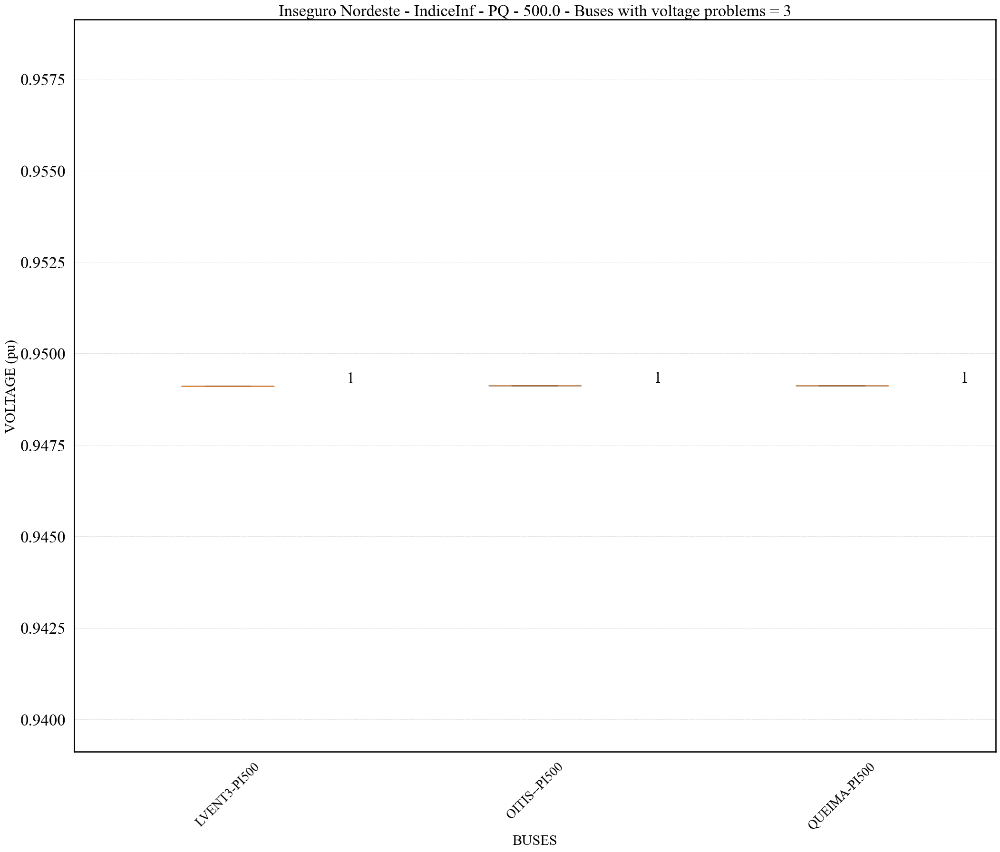

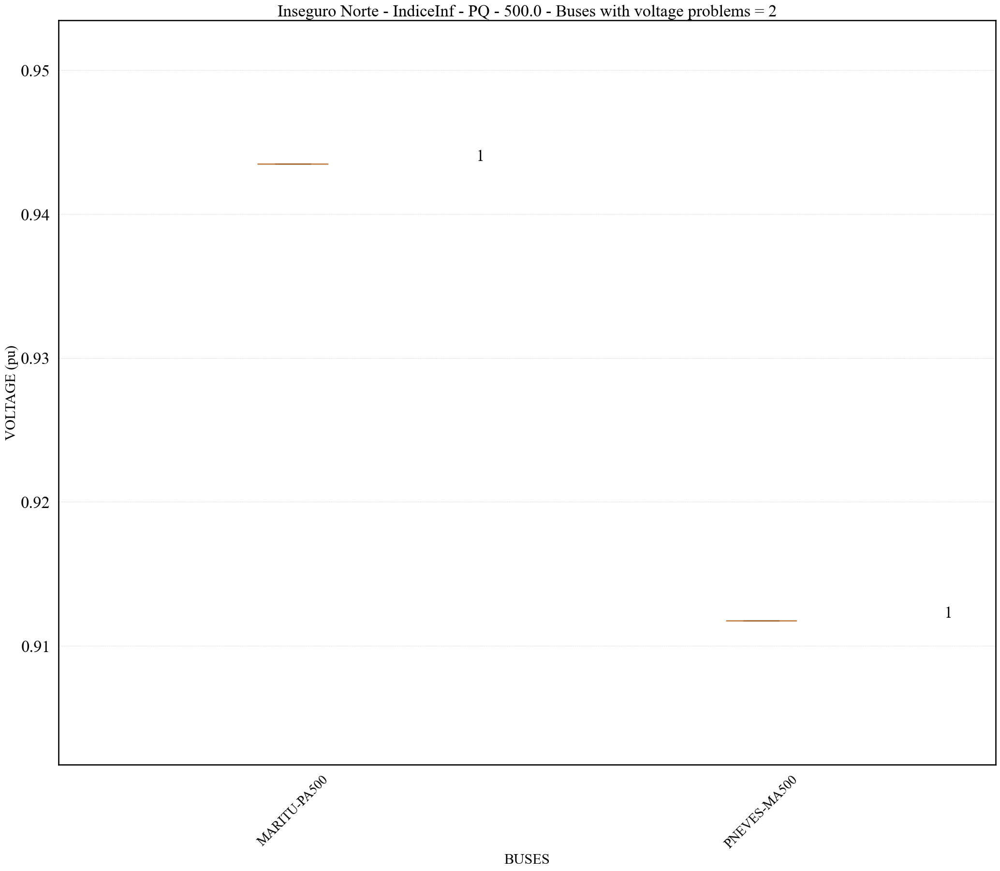

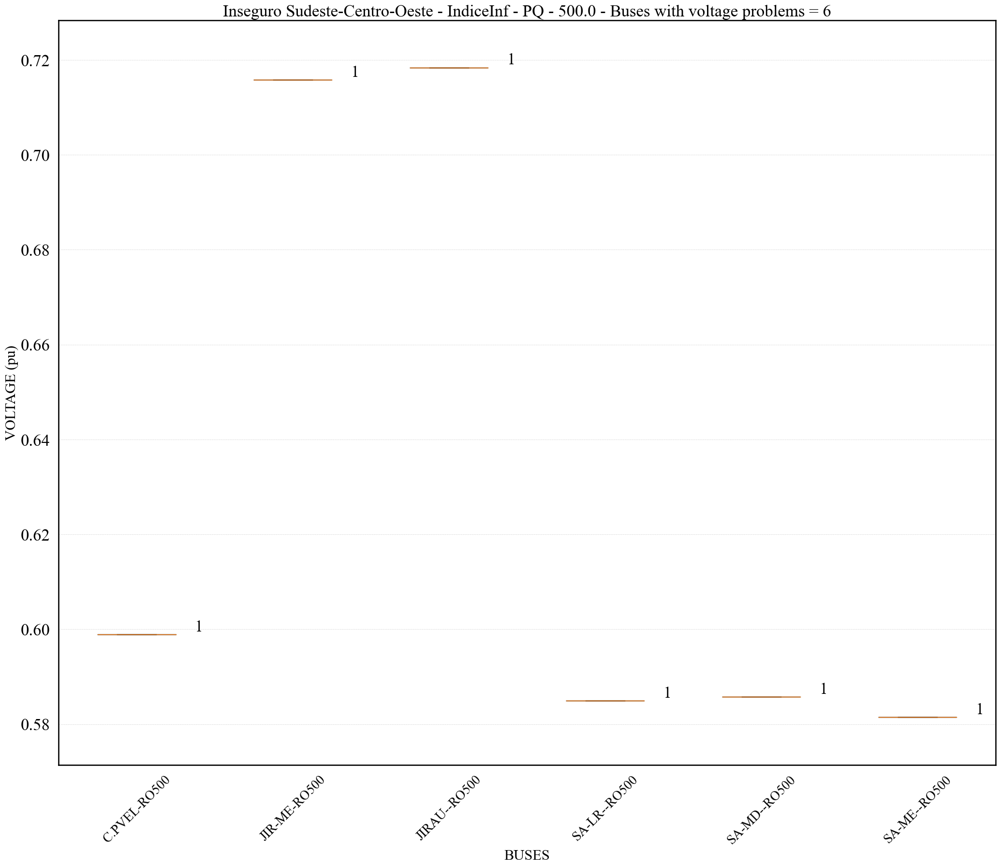

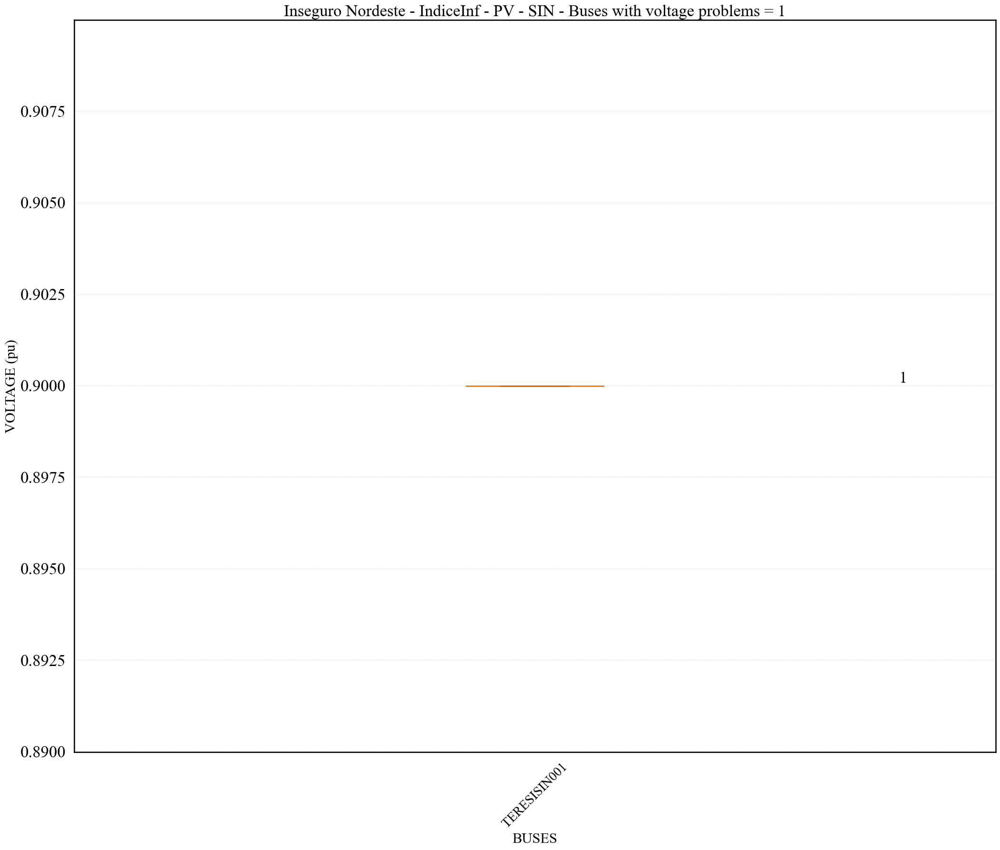

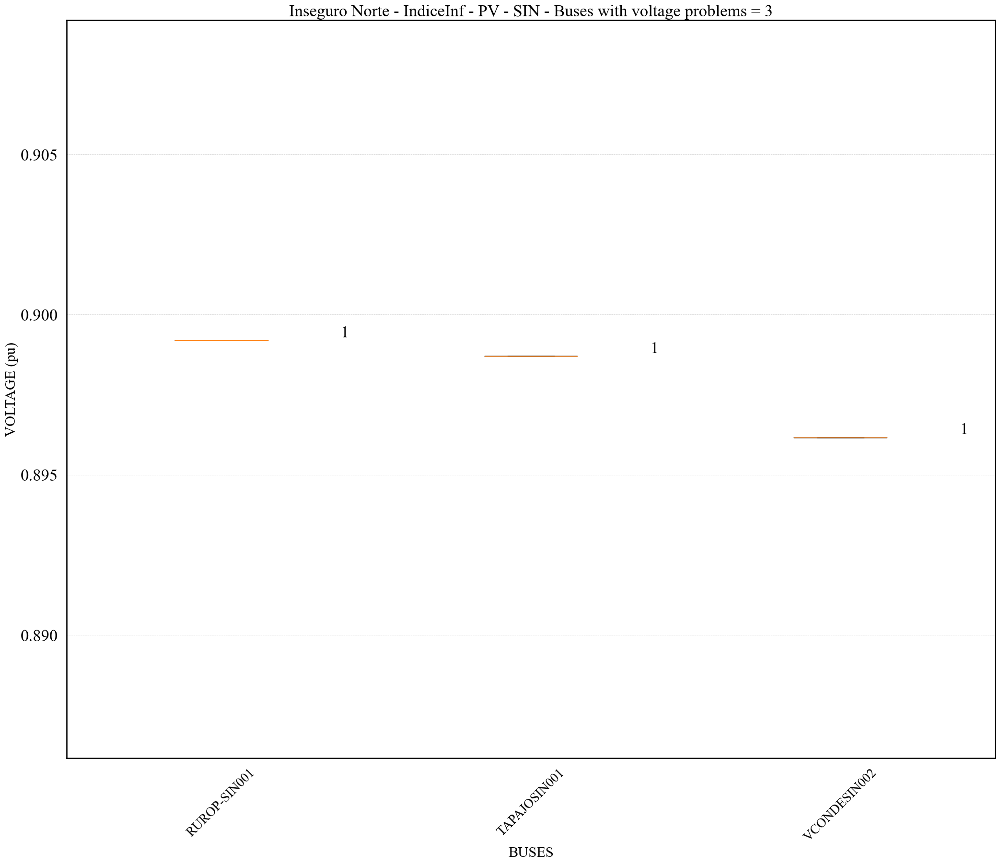

...

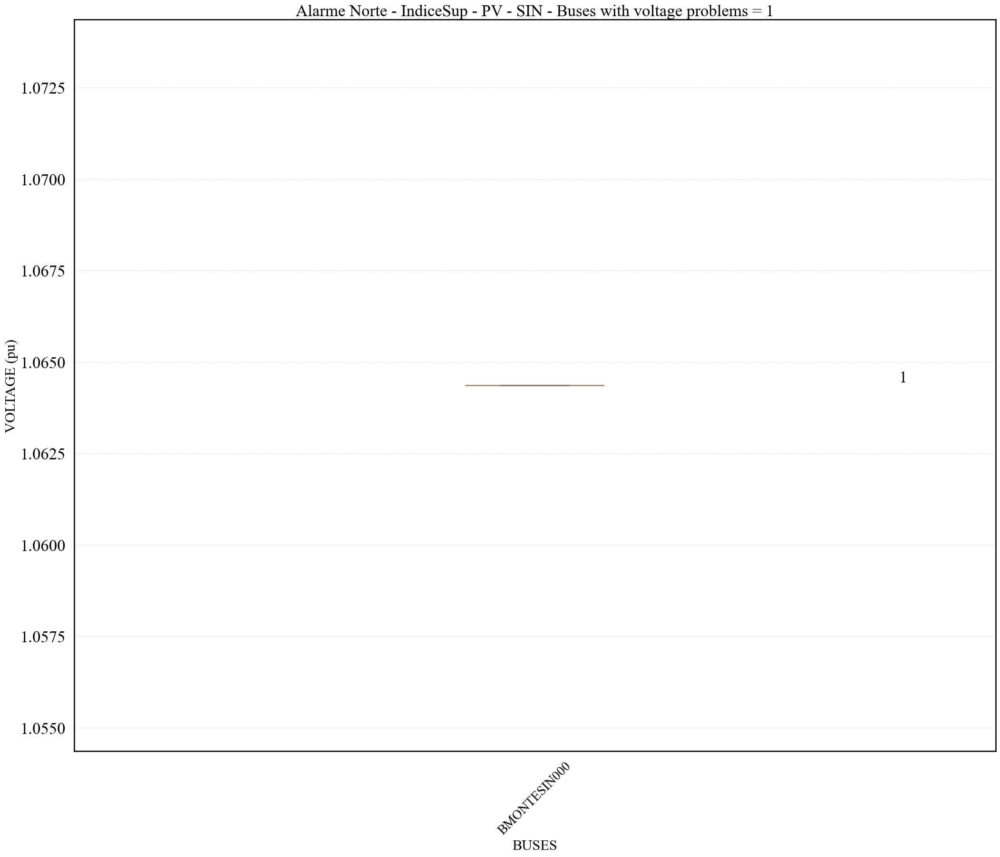

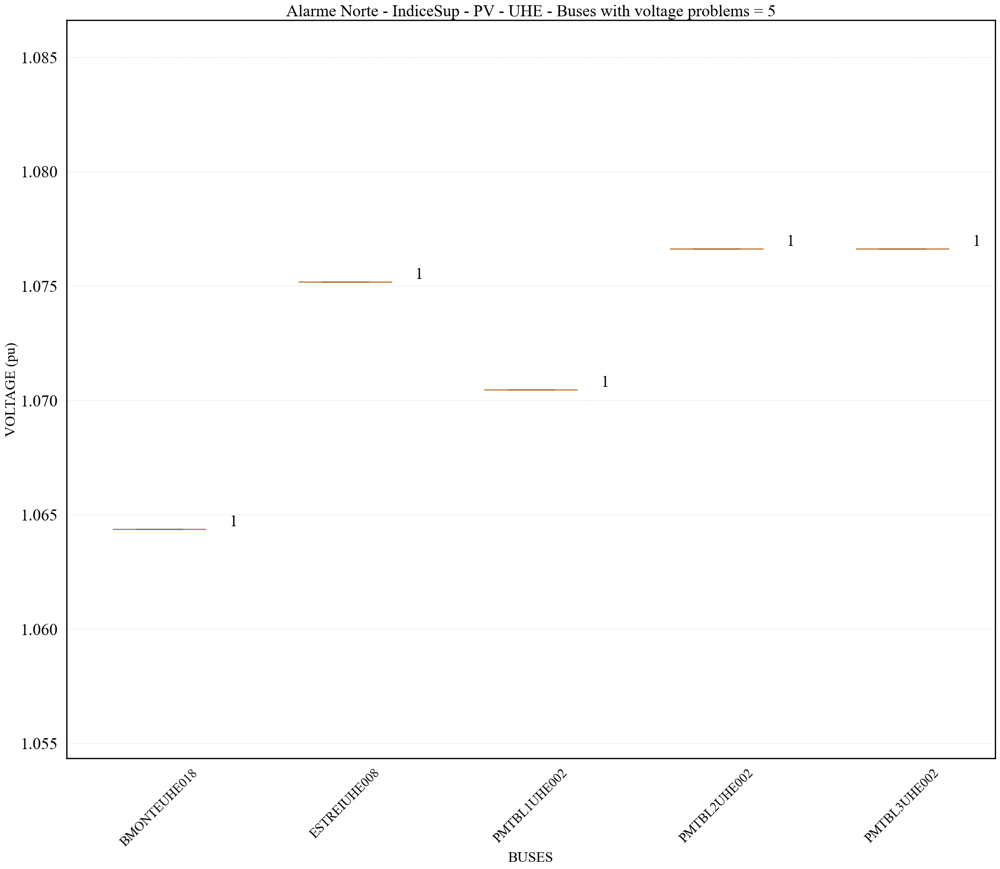

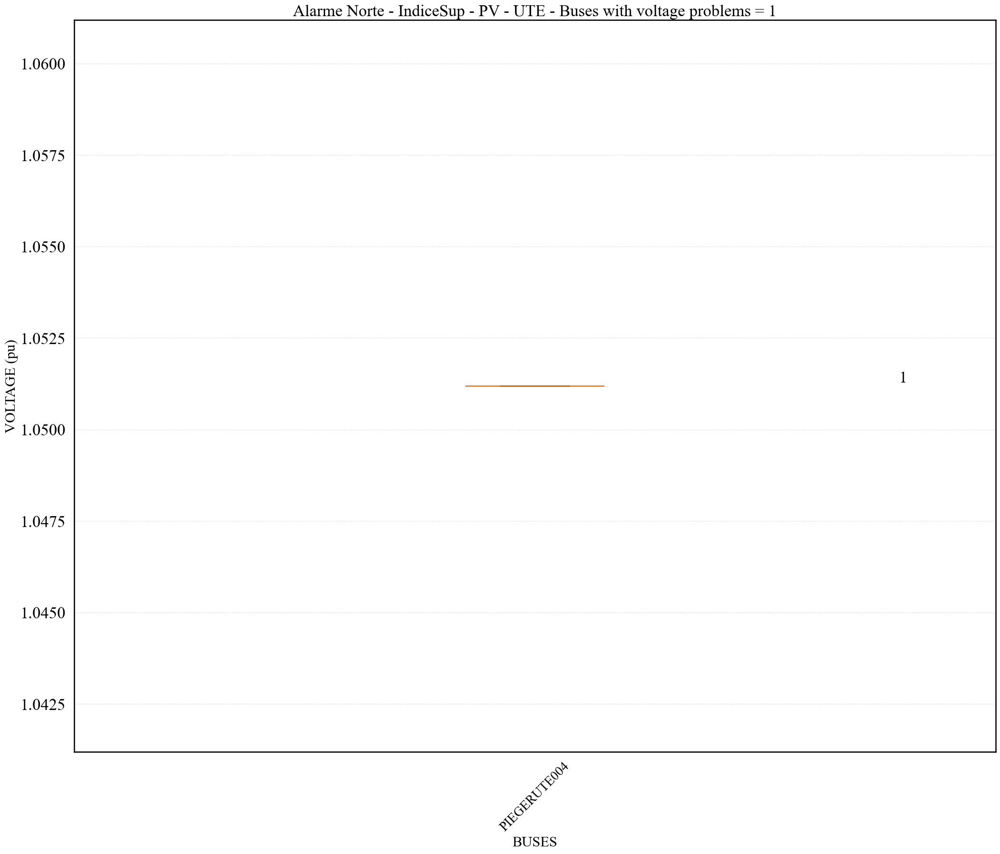

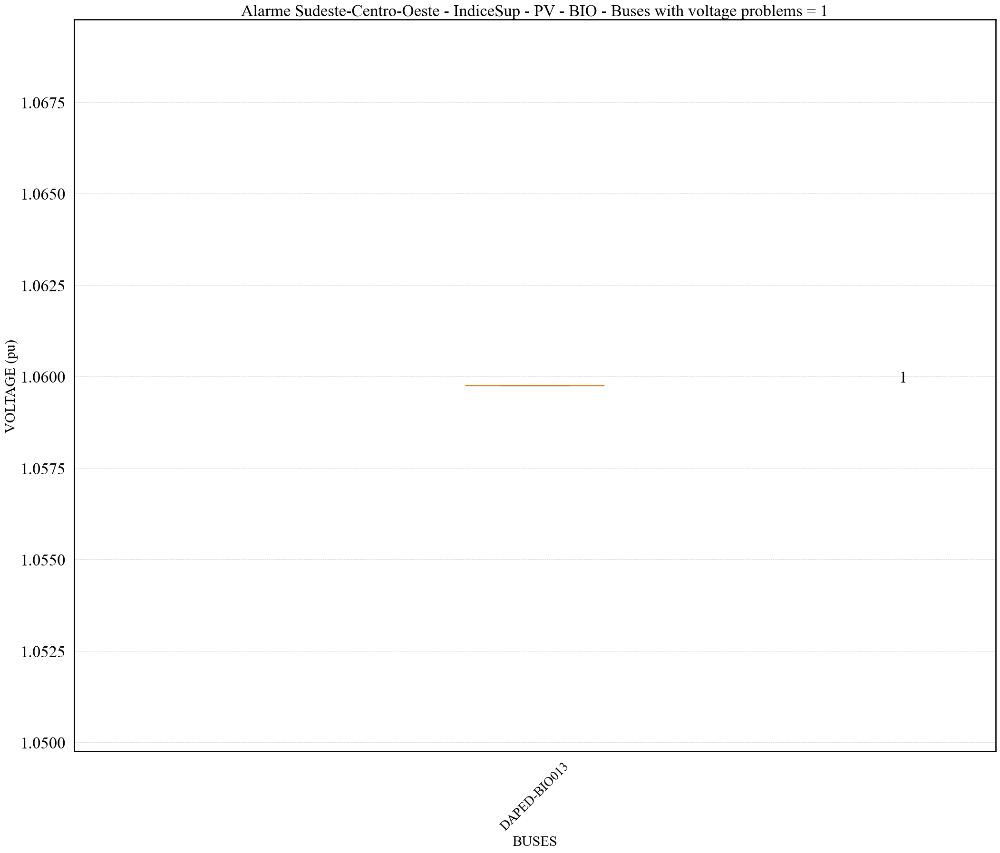

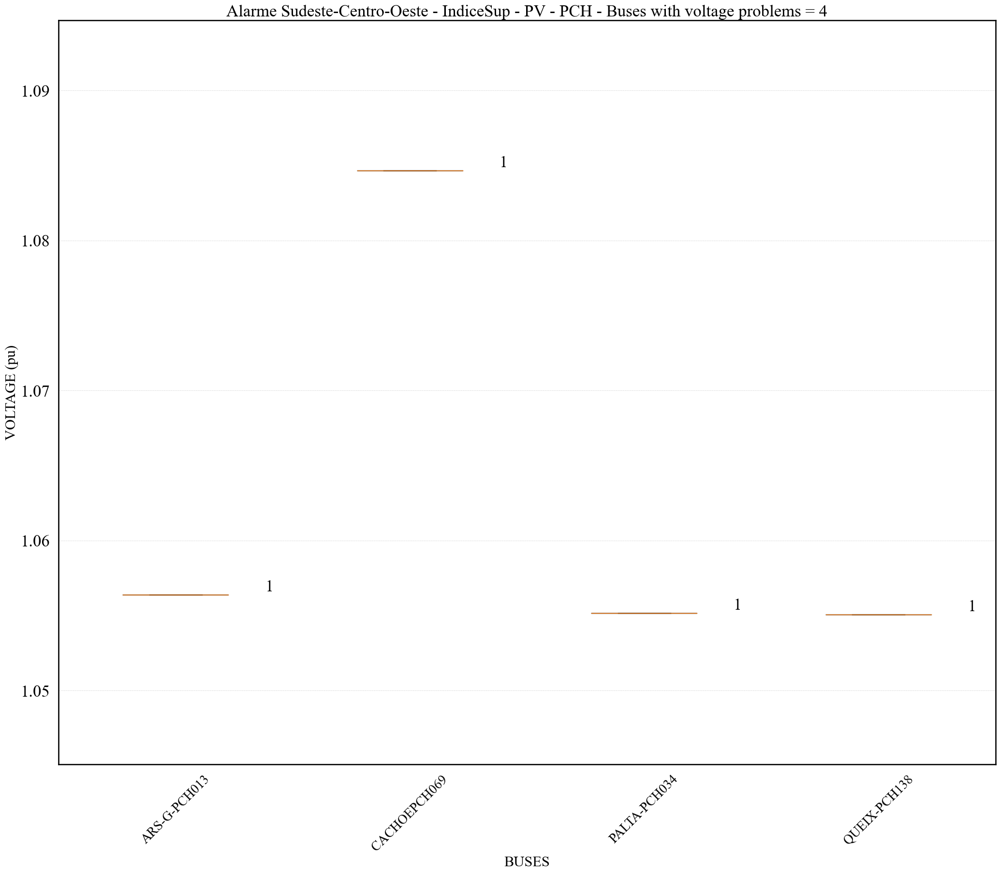

In [ ]:
if BP_Criticalbuses:

    def boxplot_plot_PB(dff_filtered_PQ, dff_filtered_PV, df_ind, condition):

        dff_PQ =  dff_filtered_PQ.groupby(by=['REG','VBASEKV','BUS_NAME']).agg(Ocurrencies = ('VBASEKV','count'), 
                                                                            MODV_PU = ('MODV_PU', list),
                                                                            MIN = ('MODV_PU', 'min'),
                                                                            MAX = ('MODV_PU', 'max')
                                                                            )

        dff_PV =  dff_filtered_PV.groupby(by=['REG','Gen_Type','BUS_NAME']).agg(Ocurrencies = ('Gen_Type','count'), 
                                                                            MODV_PU = ('MODV_PU', list),
                                                                            MIN = ('MODV_PU', 'min'),
                                                                            MAX = ('MODV_PU', 'max')
                                                                            )
        DF_dfss = [dff_PQ, dff_PV]
        name = ['PQ', 'PV']
        for idx, dff in enumerate(DF_dfss):
            regions = dff.index.get_level_values(0).unique()
            for Region in regions:
                nt = dff.loc[Region].index.get_level_values(0).unique()
                for vb in nt:
                    df_boxplot = dff.loc[Region,vb].sort_values(['Ocurrencies'], ascending = False)[:15]
                    minimo  = df_boxplot['MIN'].min() - 0.01
                    maximo =  df_boxplot['MAX'].max() + 0.01
                    numbuses =  condition + ' ' + Region + ' - ' + df_ind  + ' - ' +  name[idx] + ' - ' +  str(vb)  + ' - Buses with voltage problems = ' + str(dff.loc[Region,vb].shape[0]) 
                    plot_boxplot(df_boxplot['MODV_PU'], df_boxplot.index, numbuses , 'BUSES', 'VOLTAGE (pu)', text = True, rotation=45, limites=[minimo,maximo])
                    

    def boxplot_problematic_buses(df_busPQ,df_busPV):
        
        dicIndice = ['IndiceInf','IndiceSup']
        for df_ind in dicIndice:

            dff_filtered_PQ = df_busPQ[df_busPQ[df_ind]>1].sort_values(by=['REG','VBASEKV', 'BUS_NAME', 'MODV_PU'], ascending=[True, True, False, True])
            dff_filtered_PV = df_busPV[df_busPV[df_ind]>1].sort_values(by=['REG','Gen_Type', 'BUS_NAME', 'MODV_PU'], ascending=[True, True, False, True])
            boxplot_plot_PB(dff_filtered_PQ, dff_filtered_PV, df_ind, 'Inseguro')

            dff_filtered_PQ = df_busPQ[(df_busPQ[df_ind]<=1) & (df_busPQ[df_ind]>0)].sort_values(by=['REG','VBASEKV', 'BUS_NAME', 'MODV_PU'], ascending=[True, True, False, True])
            dff_filtered_PV = df_busPV[(df_busPV[df_ind]<=1) & (df_busPV[df_ind]>0)].sort_values(by=['REG','Gen_Type', 'BUS_NAME', 'MODV_PU'], ascending=[True, True, False, True])
            boxplot_plot_PB(dff_filtered_PQ, dff_filtered_PV, df_ind, 'Alarme')

    boxplot_problematic_buses(df_busPQ,df_busPV)

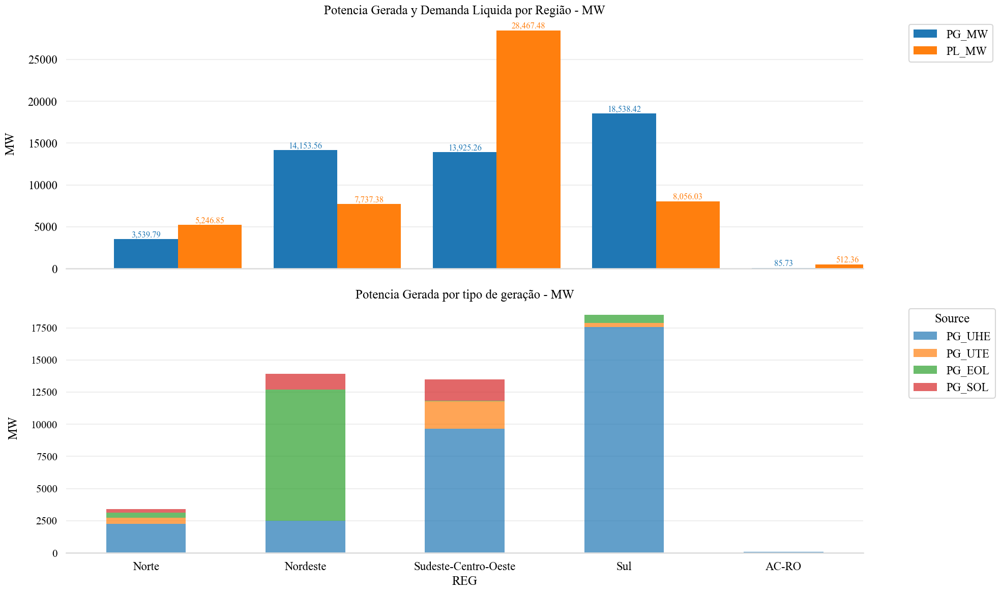

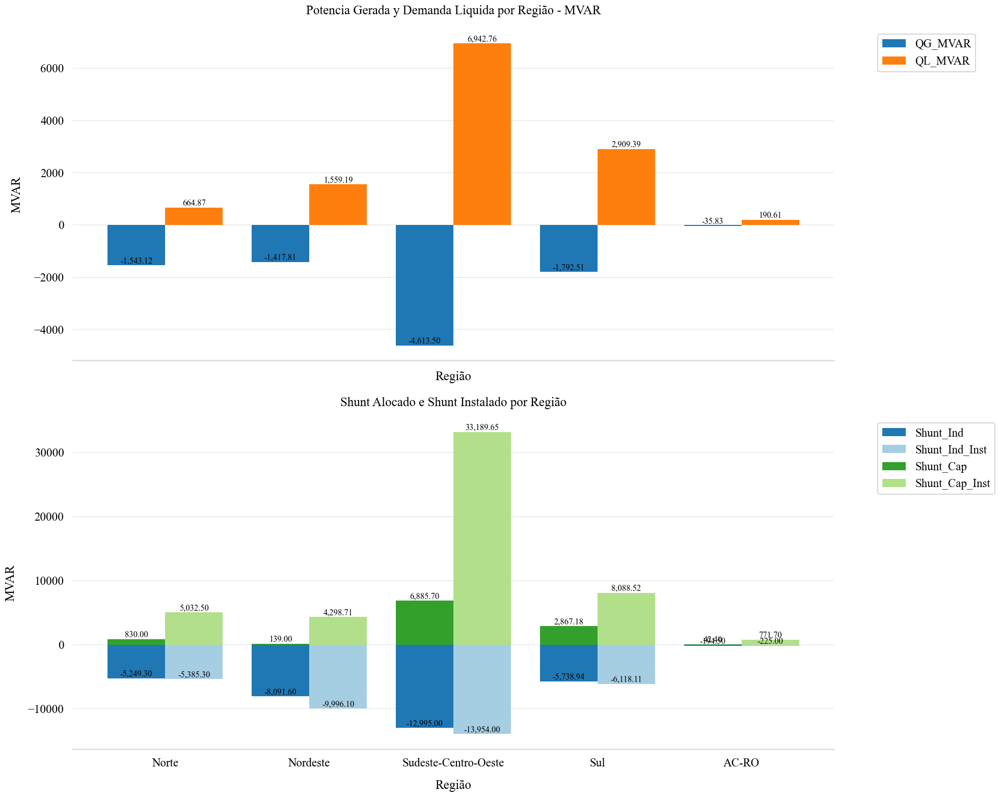

In [ ]:
dia= 'PO'
hora = DF_REGIONAL_GER.index.to_frame()['Hora'].unique()[0]
analise_regiao_plot(DF_REGIONAL_GER.loc[dia,hora],'teste')